# ***<u>About Dataset</u>***

This dataset focuses on understanding factors associated with anxiety attacks. It includes demographic details, lifestyle factors, physiological responses, and mental health indicators. The dataset is structured to help analyze relationships between various factors such as sleep, physical activity, caffeine and alcohol consumption, stress levels, and anxiety severity.

### **Key Features:**
- **Demographics:** Age, gender, occupation.
- **Lifestyle Factors:** Sleep duration, physical activity, caffeine intake, alcohol consumption, smoking status, and diet quality.
- **Mental Health Indicators:** Family history of anxiety, stress levels, therapy sessions, and major life events.
- **Physiological Responses:** Heart rate and breathing rate during an anxiety attack, sweating level, and dizziness.
- **Anxiety Severity:** Self-reported severity levels and medication use.

This dataset provides a rich foundation for exploring correlations between lifestyle choices and anxiety attack severity.

- **Dataset Link:** **[Anxiety Attack Dataset](https://www.kaggle.com/datasets/ashaychoudhary/anxiety-attack-factors-symptoms-and-severity)**


---

In [1]:
# Importing required modules 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Importing custom function from utils
from utils import *

In [2]:
# To display all columns of DataFrame
pd.set_option('display.max_columns', None)

# Setting the default values for plot size and dpi level
plt.rcParams['figure.figsize'] = (12, 5)
plt.rcParams['figure.dpi'] = 250

# Setting the default size and weight of the plot title
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

# Setting the default size and weight of axis labels
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.labelweight'] = 'bold'

In [3]:
# Reading data from the file: 'anxiety_attack_dataset.csv'
df = pd.read_csv('./Data/anxiety_attack_dataset.csv')
df.head()

,ID,Age,Gender,Occupation,Sleep Hours,Physical Activity (hrs/week),Caffeine Intake (mg/day),Alcohol Consumption (drinks/week),Smoking,Family History of Anxiety,Stress Level (1-10),Heart Rate (bpm during attack),Breathing Rate (breaths/min),Sweating Level (1-5),Dizziness,Medication,Therapy Sessions (per month),Recent Major Life Event,Diet Quality (1-10),Severity of Anxiety Attack (1-10)
0,1,56,Female,Other,9.6,8.3,175,6,No,No,4,145,33,3,No,No,4,Yes,9,10
1,2,46,Male,Teacher,6.4,7.3,97,6,No,No,3,143,18,5,Yes,No,0,No,9,8
2,3,32,Female,Doctor,6.9,1.0,467,14,No,No,2,60,34,1,No,No,7,Yes,10,5
3,4,60,Male,Doctor,9.2,3.7,471,16,No,Yes,6,94,19,1,No,Yes,4,Yes,5,8
4,5,25,Male,Student,9.2,2.5,364,2,No,Yes,7,152,15,4,No,Yes,0,No,1,1


In [4]:
# Checking the statistics of all of numerical columns
df.describe(include=np.number).T.drop('count', axis = 1)

,mean,std,min,25%,50%,75%,max
ID,6000.500000,3464.245950,1.0,3000.75,6000.5,9000.250,12000.0
Age,40.966750,13.473280,18.0,29.00,41.0,53.000,64.0
Sleep Hours,6.482650,2.014885,3.0,4.80,6.5,8.200,10.0
Physical Activity (hrs/week),5.030892,2.889000,0.0,2.50,5.0,7.525,10.0
Caffeine Intake (mg/day),246.696083,144.487071,0.0,122.00,244.0,371.000,499.0
Alcohol Consumption (drinks/week),9.492833,5.769364,0.0,5.00,9.0,15.000,19.0
Stress Level (1-10),5.462250,2.897201,1.0,3.00,5.0,8.000,10.0
Heart Rate (bpm during attack),119.398500,34.806711,60.0,89.00,119.0,149.000,179.0
Breathing Rate (breaths/min),25.462333,8.090686,12.0,18.00,25.0,32.000,39.0
Sweating Level (1-5),2.987417,1.414482,1.0,2.00,3.0,4.000,5.0


In [5]:
# Checking statistics of all categorical columns
df.describe(include='object').T.drop('count', axis = 1)

,unique,top,freq
Gender,3,Female,5809
Occupation,6,Unemployed,2139
Smoking,2,No,8417
Family History of Anxiety,2,No,7179
Dizziness,2,No,8406
Medication,2,No,9605
Recent Major Life Event,2,No,9054


In [6]:
# Checking the datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   ID                                 12000 non-null  int64  
 1   Age                                12000 non-null  int64  
 2   Gender                             12000 non-null  object 
 3   Occupation                         12000 non-null  object 
 4   Sleep Hours                        12000 non-null  float64
 5   Physical Activity (hrs/week)       12000 non-null  float64
 6   Caffeine Intake (mg/day)           12000 non-null  int64  
 7   Alcohol Consumption (drinks/week)  12000 non-null  int64  
 8   Smoking                            12000 non-null  object 
 9   Family History of Anxiety          12000 non-null  object 
 10  Stress Level (1-10)                12000 non-null  int64  
 11  Heart Rate (bpm during attack)     12000 non-null  int

In [7]:
# Checking null values in the dataset
df.isnull().sum()

ID                                   0
Age                                  0
Gender                               0
Occupation                           0
Sleep Hours                          0
Physical Activity (hrs/week)         0
Caffeine Intake (mg/day)             0
Alcohol Consumption (drinks/week)    0
Smoking                              0
Family History of Anxiety            0
Stress Level (1-10)                  0
Heart Rate (bpm during attack)       0
Breathing Rate (breaths/min)         0
Sweating Level (1-5)                 0
Dizziness                            0
Medication                           0
Therapy Sessions (per month)         0
Recent Major Life Event              0
Diet Quality (1-10)                  0
Severity of Anxiety Attack (1-10)    0
dtype: int64

In [8]:
# Renaming columns
df.columns = [
    'participant_id', 'age', 'gender', 'occupation', 'sleep_duration_hrs_night', 'physical_activity_hrs_week', 
    'caffeine_intake_mg_day', 'alcohol_consumption_drinks_week', 'smoking_status', 'family_history_of_anxiety', 'stress_level', 
    'heart_rate_bpm_during_attack', 'breathing_rate_breaths_min', 'sweating_level', 'dizziness', 'medication', 
    'therapy_sessions_per_month', 'recent_major_life_event', 'diet_quality', 'severity_of_anxiety_attack'
]

df.head()

,participant_id,age,gender,occupation,sleep_duration_hrs_night,physical_activity_hrs_week,caffeine_intake_mg_day,alcohol_consumption_drinks_week,smoking_status,family_history_of_anxiety,stress_level,heart_rate_bpm_during_attack,breathing_rate_breaths_min,sweating_level,dizziness,medication,therapy_sessions_per_month,recent_major_life_event,diet_quality,severity_of_anxiety_attack
0,1,56,Female,Other,9.6,8.3,175,6,No,No,4,145,33,3,No,No,4,Yes,9,10
1,2,46,Male,Teacher,6.4,7.3,97,6,No,No,3,143,18,5,Yes,No,0,No,9,8
2,3,32,Female,Doctor,6.9,1.0,467,14,No,No,2,60,34,1,No,No,7,Yes,10,5
3,4,60,Male,Doctor,9.2,3.7,471,16,No,Yes,6,94,19,1,No,Yes,4,Yes,5,8
4,5,25,Male,Student,9.2,2.5,364,2,No,Yes,7,152,15,4,No,Yes,0,No,1,1


In [9]:
# Checking the correlation of each numerical column with the 'severity_of_anxiety_attack' column
df.corr(numeric_only=True)['severity_of_anxiety_attack'].sort_values()

age                               -0.020083
participant_id                    -0.018602
therapy_sessions_per_month        -0.013648
diet_quality                      -0.010190
sleep_duration_hrs_night          -0.003293
heart_rate_bpm_during_attack      -0.000312
stress_level                       0.003194
caffeine_intake_mg_day             0.004023
breathing_rate_breaths_min         0.006471
sweating_level                     0.008773
alcohol_consumption_drinks_week    0.009288
physical_activity_hrs_week         0.018012
severity_of_anxiety_attack         1.000000
Name: severity_of_anxiety_attack, dtype: float64

---

## ***<u>Explanatory Data Analysis</u>***

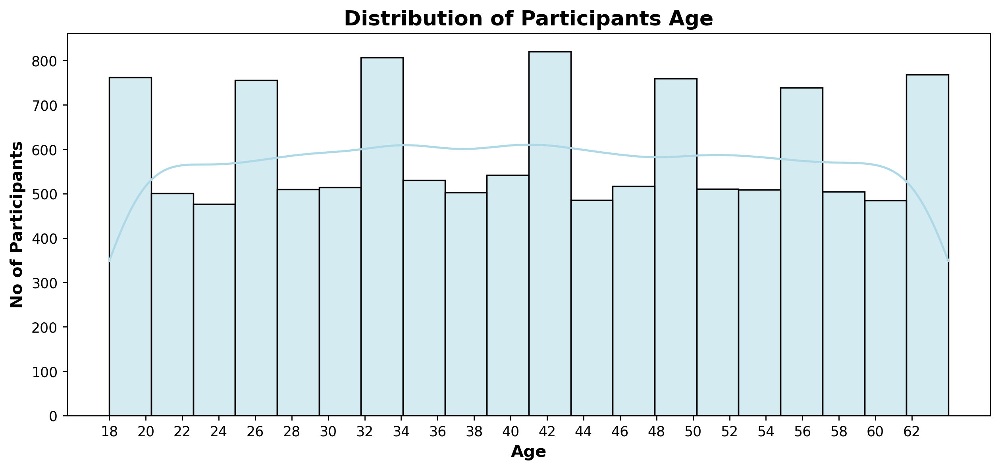

In [10]:
# Checking what is the distribution of participants by age
sns.histplot(
    data = df, 
    x = 'age',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Age")
plt.xlabel("Age")
plt.ylabel("No of Participants")

# Changing the values of xticks
min_value = df['age'].min()
max_value = df['age'].max()
plt.xticks(range(min_value, max_value, 2));

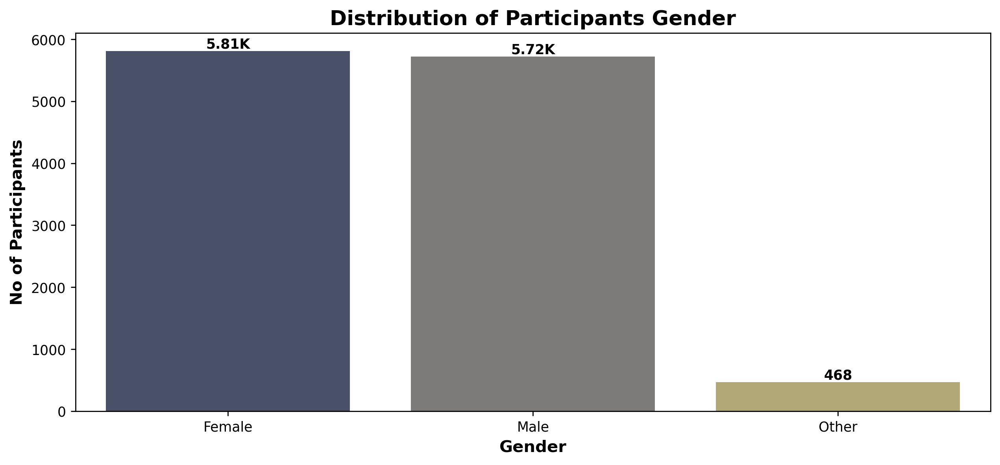

In [11]:
# Checking what is the gender distribution of participants
ax = sns.countplot(
    data = df,
    x = 'gender',
    hue = 'gender',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Gender")
plt.xlabel("Gender")
plt.ylabel("No of Participants");

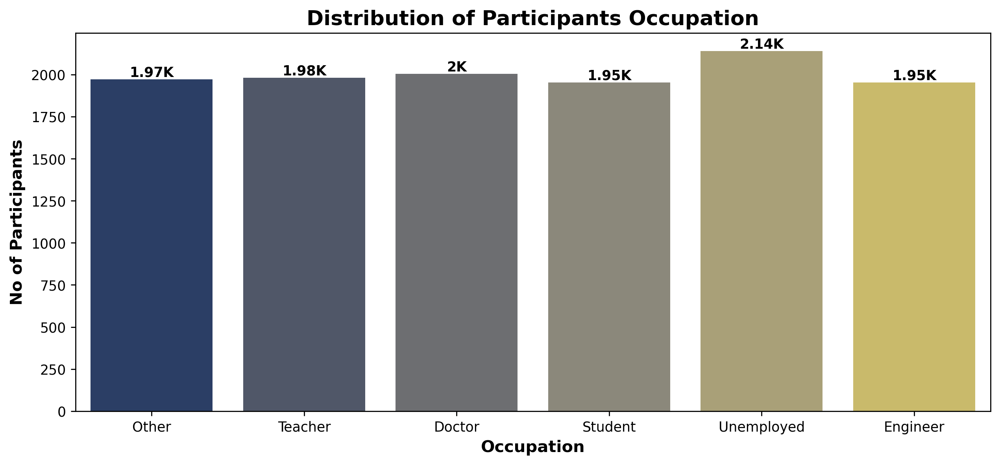

In [12]:
# Checking what is the occupation distribution of participants
ax = sns.countplot(
    data = df,
    x = 'occupation',
    hue = 'occupation',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Occupation")
plt.xlabel("Occupation")
plt.ylabel("No of Participants");

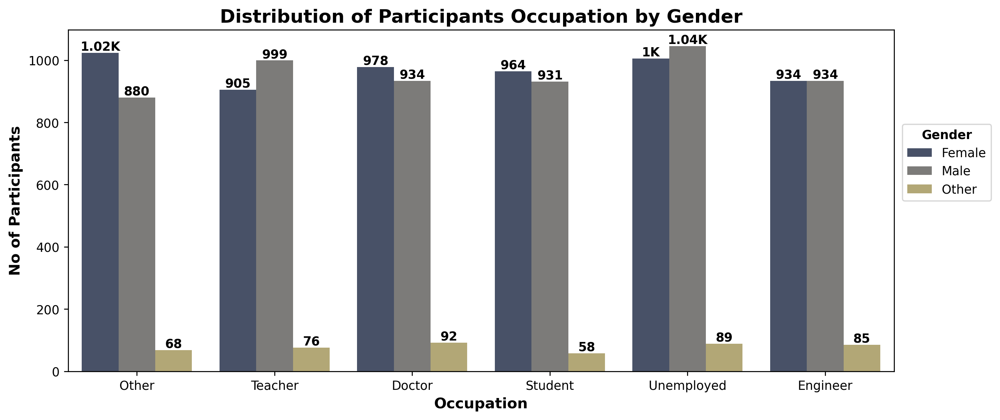

In [13]:
# Checking what is the occupation distribution of participants by gender
ax = sns.countplot(
    data = df,
    x = 'occupation',
    hue = 'gender',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Occupation by Gender")
plt.xlabel("Occupation")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [14]:
# Creating a new column: 'age_group'

## Bins and labels for the age group columns
age_group_bins = [17, 24, 35, 45, 55, 64]
age_group_labels = ["18-24", "25-34", "35-44", "45-54", "55-64"]


## Using pd.cut to create age group column
df['age_group'] = pd.cut(df['age'], bins = age_group_bins, labels = age_group_labels)
df.head()

,participant_id,age,gender,occupation,sleep_duration_hrs_night,physical_activity_hrs_week,caffeine_intake_mg_day,alcohol_consumption_drinks_week,smoking_status,family_history_of_anxiety,stress_level,heart_rate_bpm_during_attack,breathing_rate_breaths_min,sweating_level,dizziness,medication,therapy_sessions_per_month,recent_major_life_event,diet_quality,severity_of_anxiety_attack,age_group
0,1,56,Female,Other,9.6,8.3,175,6,No,No,4,145,33,3,No,No,4,Yes,9,10,55-64
1,2,46,Male,Teacher,6.4,7.3,97,6,No,No,3,143,18,5,Yes,No,0,No,9,8,45-54
2,3,32,Female,Doctor,6.9,1.0,467,14,No,No,2,60,34,1,No,No,7,Yes,10,5,25-34
3,4,60,Male,Doctor,9.2,3.7,471,16,No,Yes,6,94,19,1,No,Yes,4,Yes,5,8,55-64
4,5,25,Male,Student,9.2,2.5,364,2,No,Yes,7,152,15,4,No,Yes,0,No,1,1,25-34


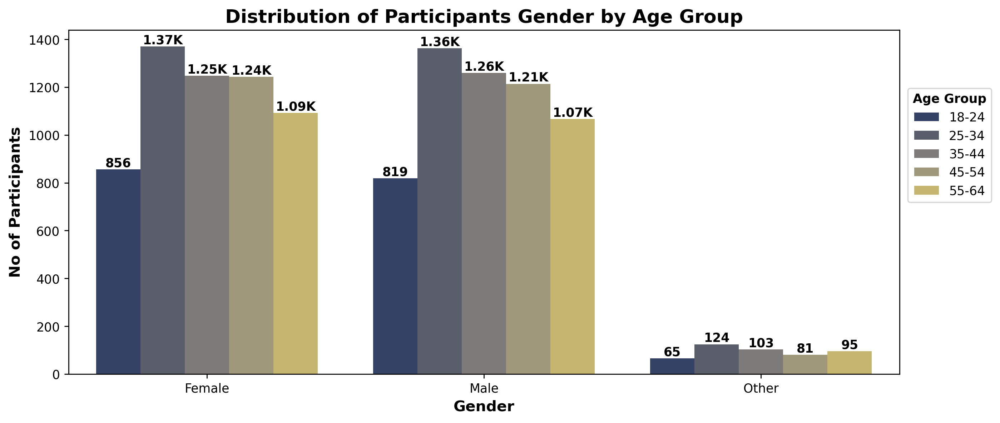

In [15]:
# Checking what is the gender distribution of participants by age group
ax = sns.countplot(
    data = df,
    x = 'gender',
    hue = 'age_group',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Gender by Age Group")
plt.xlabel("Gender")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

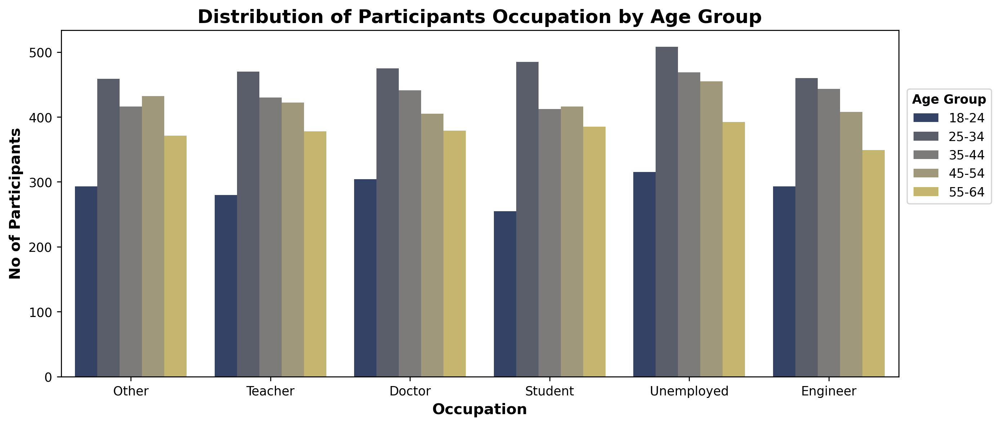

In [16]:
# Checking what is the occupation distribution of participants by age group
ax = sns.countplot(
    data = df,
    x = 'occupation',
    hue = 'age_group',
    palette = 'cividis',
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Occupation by Age Group")
plt.xlabel("Occupation")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

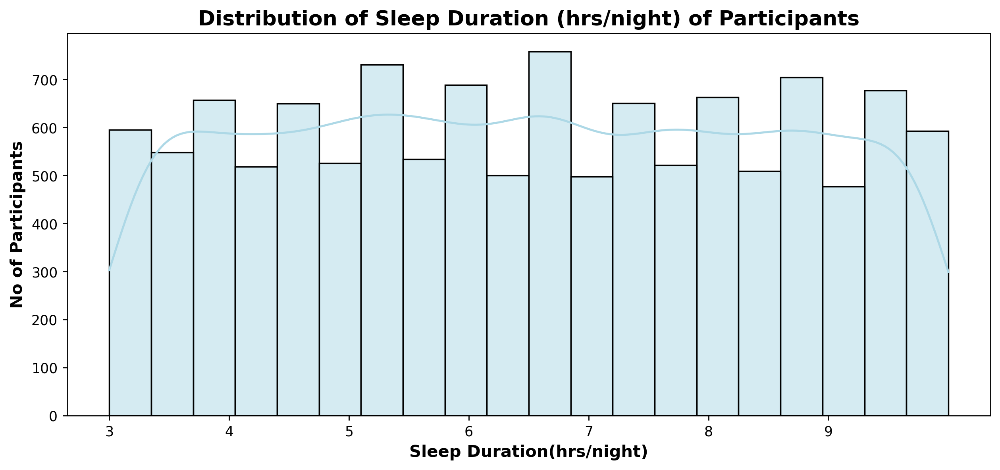

In [17]:
# Checking what is the distribution of sleep duration among participants
sns.histplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Sleep Duration (hrs/night) of Participants")
plt.xlabel("Sleep Duration(hrs/night)")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['sleep_duration_hrs_night'].min())
max_value = round(df['sleep_duration_hrs_night'].max())
plt.xticks(range(min_value, max_value, 1));

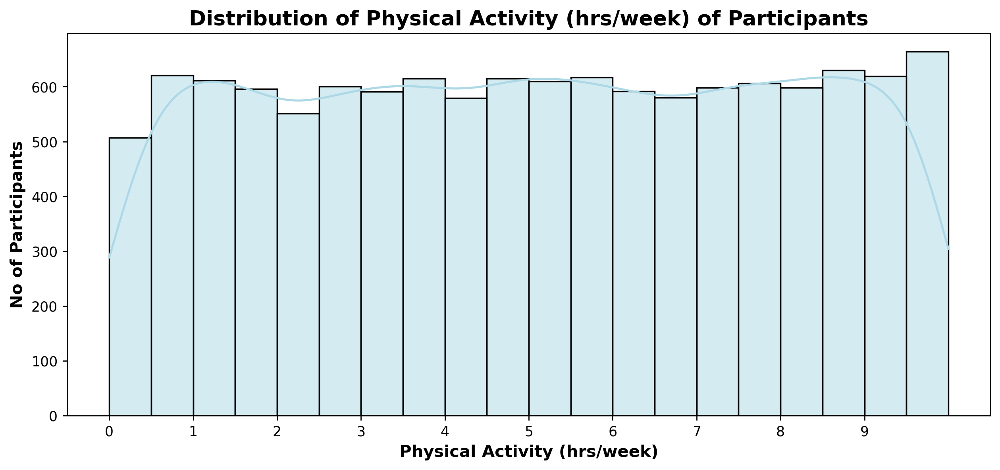

In [18]:
# Checking what is the distribution of physical activity among participants
sns.histplot(
    data = df, 
    x = 'physical_activity_hrs_week',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Physical Activity (hrs/week) of Participants")
plt.xlabel("Physical Activity (hrs/week)")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['physical_activity_hrs_week'].min())
max_value = round(df['physical_activity_hrs_week'].max())
plt.xticks(range(min_value, max_value, 1));

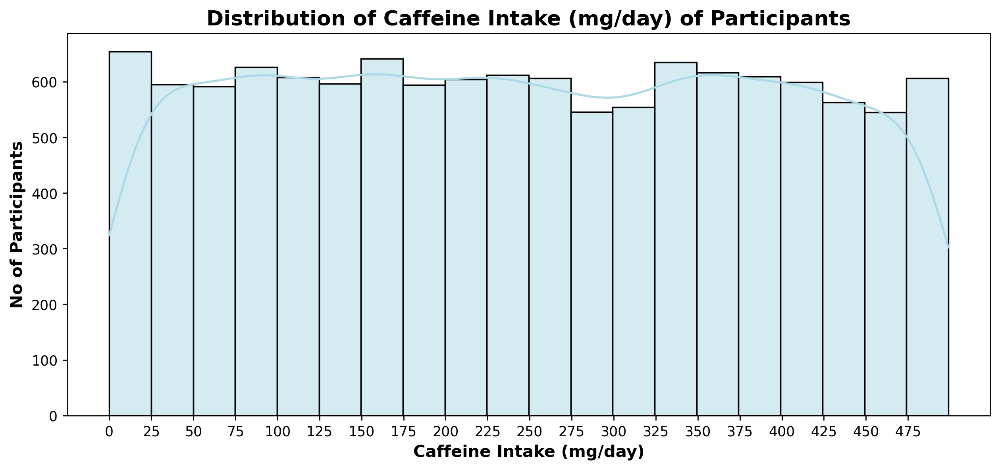

In [19]:
# Checking what is the distribution of caffeine intake among participants
sns.histplot(
    data = df, 
    x = 'caffeine_intake_mg_day',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Caffeine Intake (mg/day) of Participants")
plt.xlabel("Caffeine Intake (mg/day)")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['caffeine_intake_mg_day'].min())
max_value = round(df['caffeine_intake_mg_day'].max())
plt.xticks(range(min_value, max_value, 25));

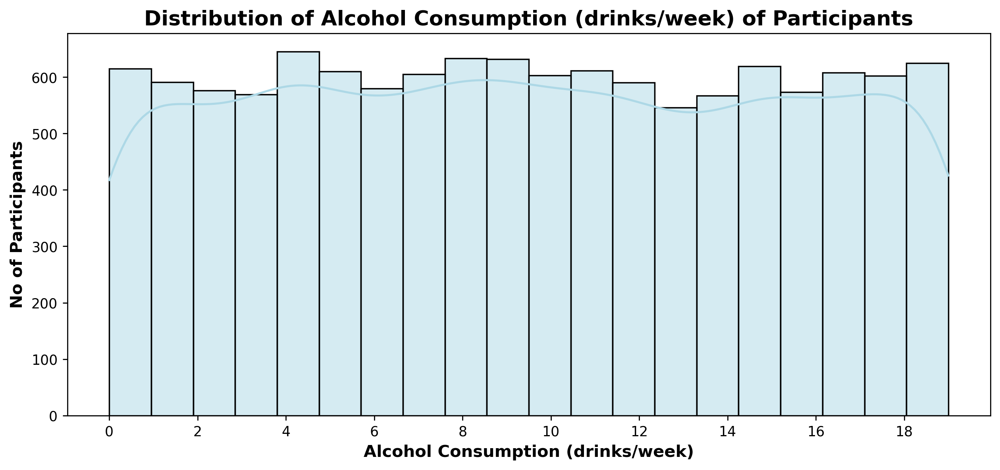

In [20]:
# Checking what is the distribution of caffeine intake among participants
sns.histplot(
    data = df, 
    x = 'alcohol_consumption_drinks_week',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Alcohol Consumption (drinks/week) of Participants")
plt.xlabel("Alcohol Consumption (drinks/week)")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['alcohol_consumption_drinks_week'].min())
max_value = round(df['alcohol_consumption_drinks_week'].max())
plt.xticks(range(min_value, max_value, 2));

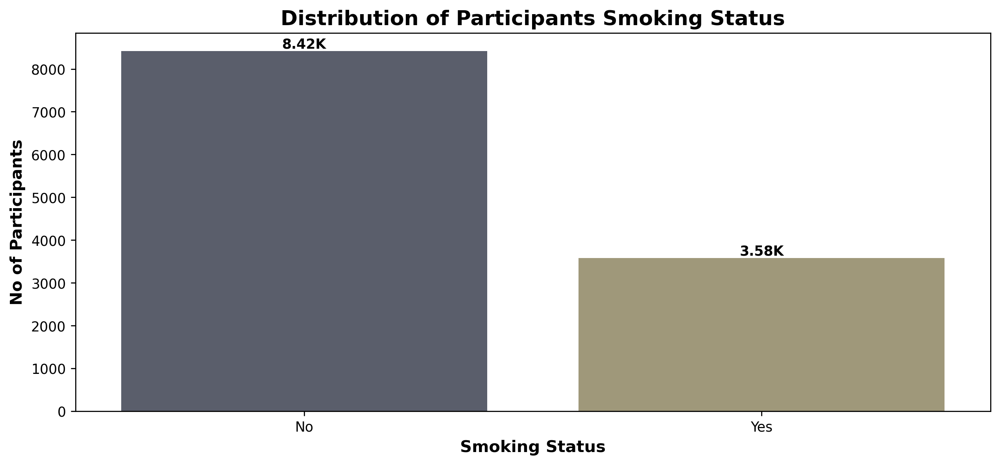

In [21]:
# Checking what is the distribution smoking status among participants
ax = sns.countplot(
    data = df,
    x = 'smoking_status',
    hue = 'smoking_status',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Smoking Status")
plt.xlabel("Smoking Status")
plt.ylabel("No of Participants");

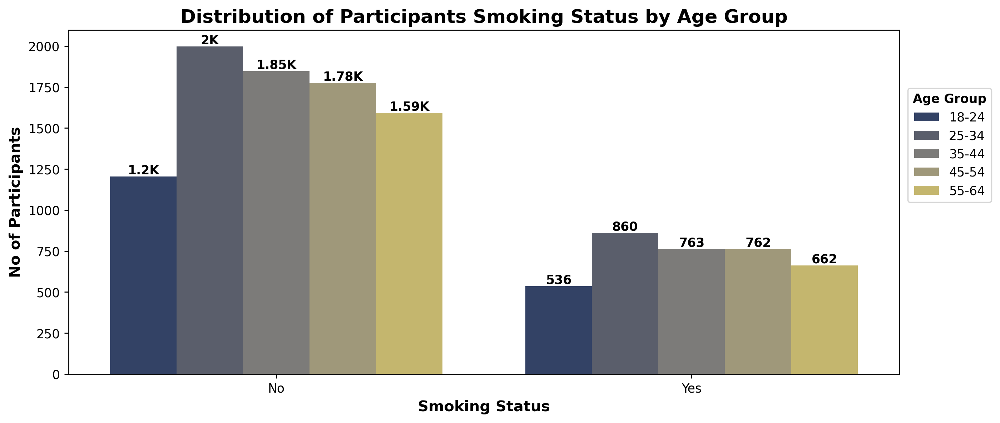

In [22]:
# Checking what is the distribution smoking status among participants by age group
ax = sns.countplot(
    data = df,
    x = 'smoking_status',
    hue = 'age_group',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Smoking Status by Age Group")
plt.xlabel("Smoking Status")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

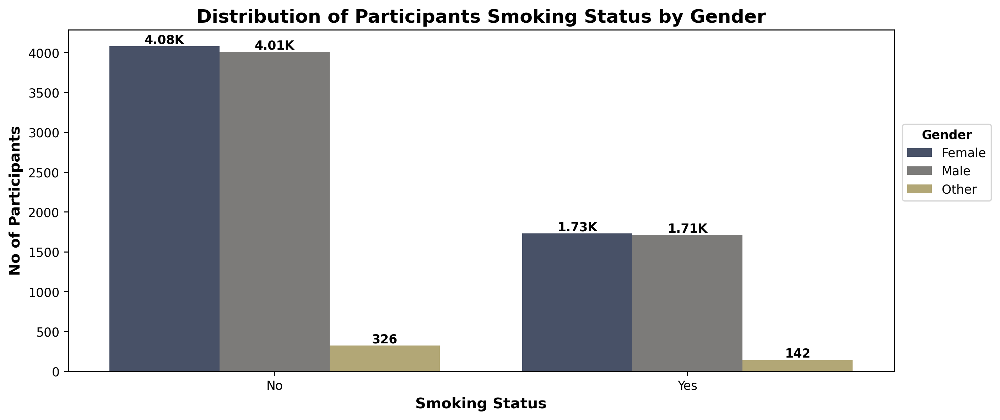

In [23]:
# Checking what is the distribution smoking status among participants by gender
ax = sns.countplot(
    data = df,
    x = 'smoking_status',
    hue = 'gender',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Smoking Status by Gender")
plt.xlabel("Smoking Status")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

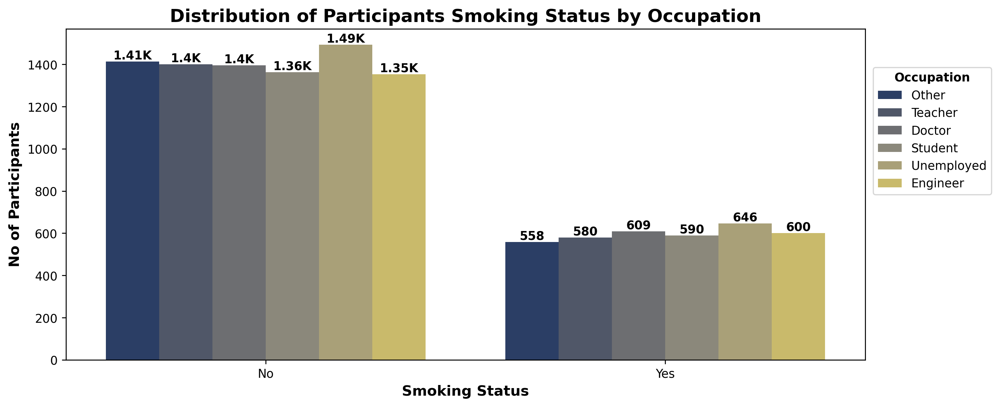

In [24]:
# Checking what is the distribution of smoking status among participants by occupation
ax = sns.countplot(
    data = df,
    x = 'smoking_status',
    hue = 'occupation',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Smoking Status by Occupation")
plt.xlabel("Smoking Status")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

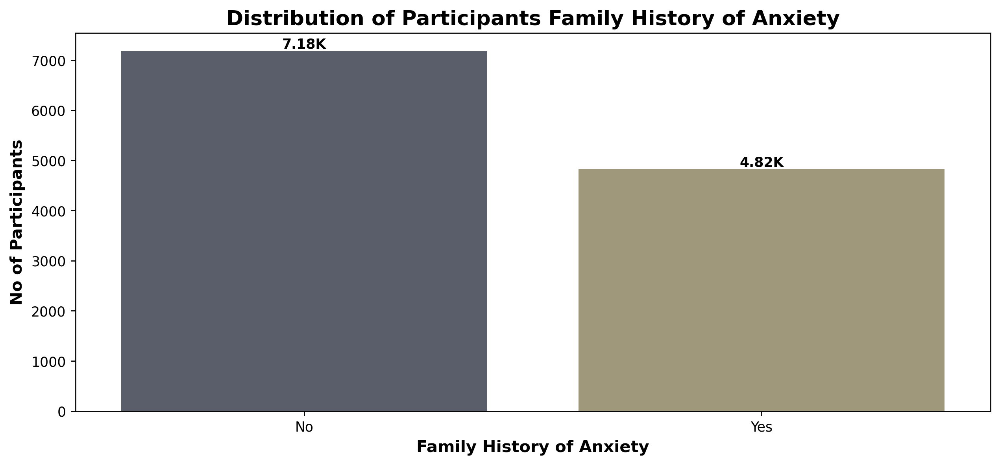

In [25]:
# Checking what is the distribution familty history of anxiety among participants
ax = sns.countplot(
    data = df,
    x = 'family_history_of_anxiety',
    hue = 'family_history_of_anxiety',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Family History of Anxiety")
plt.xlabel("Family History of Anxiety")
plt.ylabel("No of Participants");

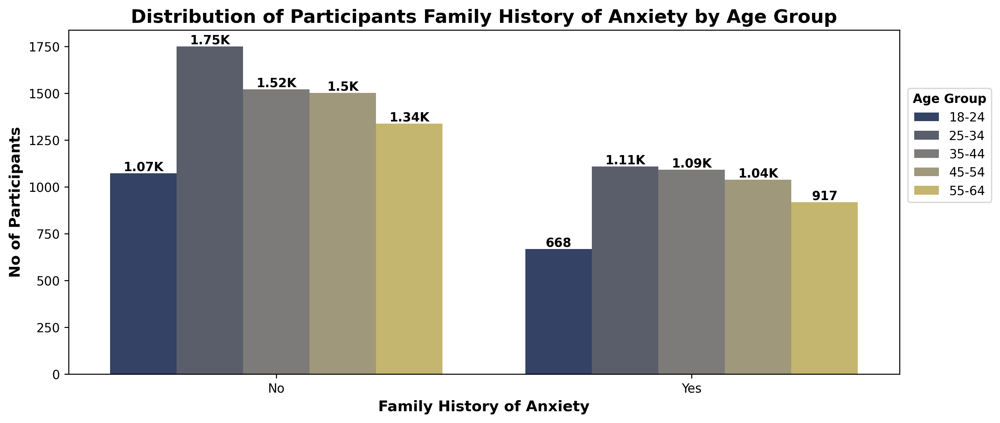

In [26]:
# Checking what is the distribution familty history of anxiety among participants by age group
ax = sns.countplot(
    data = df,
    x = 'family_history_of_anxiety',
    hue = 'age_group',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Family History of Anxiety by Age Group")
plt.xlabel("Family History of Anxiety")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

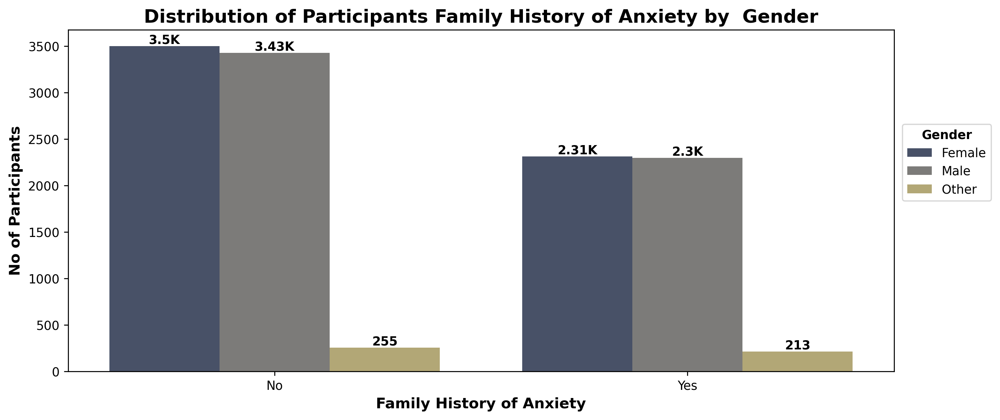

In [27]:
# Checking what is the distribution familty history of anxiety among participants by gender
ax = sns.countplot(
    data = df,
    x = 'family_history_of_anxiety',
    hue = 'gender',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Family History of Anxiety by  Gender")
plt.xlabel("Family History of Anxiety")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

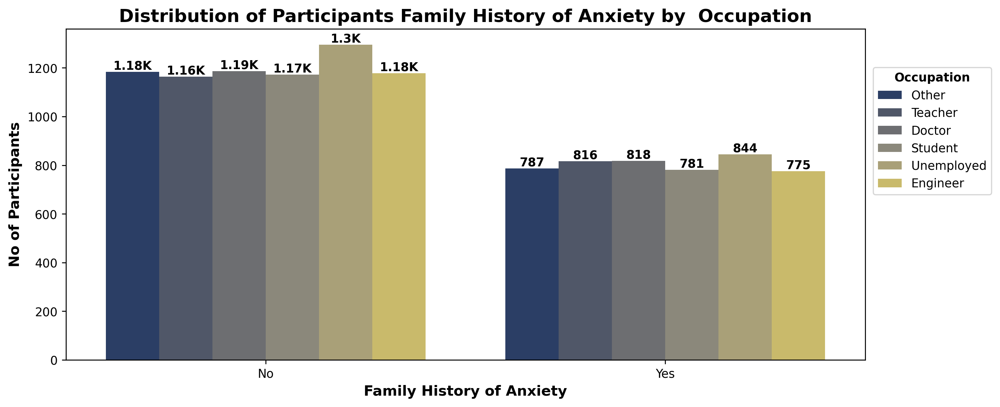

In [28]:
# Checking what is the distribution familty history of anxiety among participants by occupation
ax = sns.countplot(
    data = df,
    x = 'family_history_of_anxiety',
    hue = 'occupation',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Family History of Anxiety by  Occupation")
plt.xlabel("Family History of Anxiety")
plt.ylabel("No of Participants")

# Setting location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

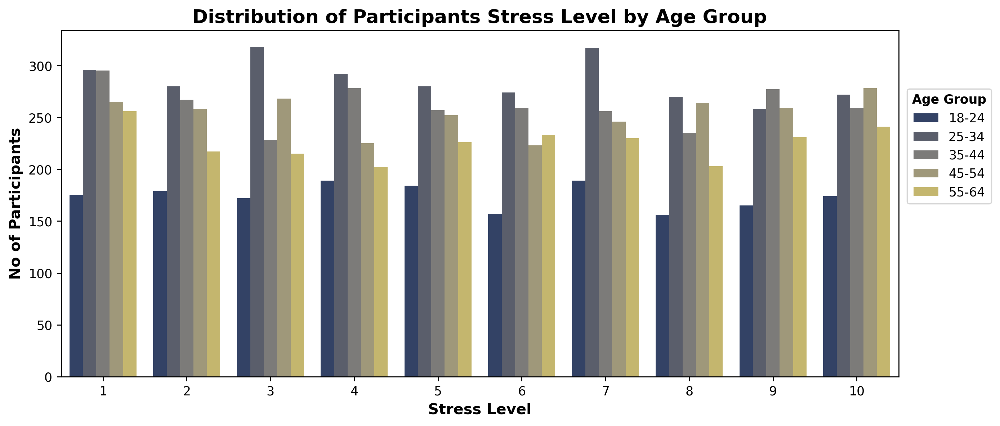

In [29]:
# Checking how does stress level vary among participants by age group
ax = sns.countplot(
    data = df,
    x = 'stress_level',
    hue = 'age_group',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Stress Level by Age Group")
plt.xlabel("Stress Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

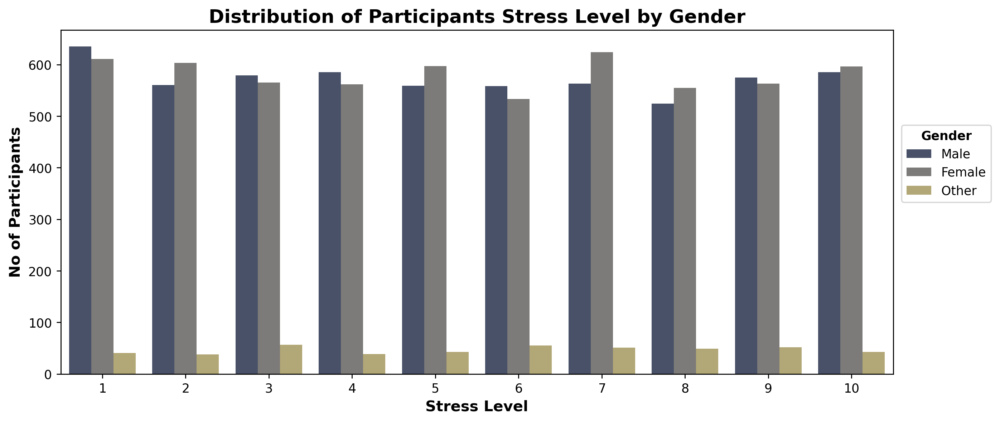

In [30]:
# Checking how does stress level vary among participants by gender
ax = sns.countplot(
    data = df,
    x = 'stress_level',
    hue = 'gender',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Stress Level by Gender")
plt.xlabel("Stress Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

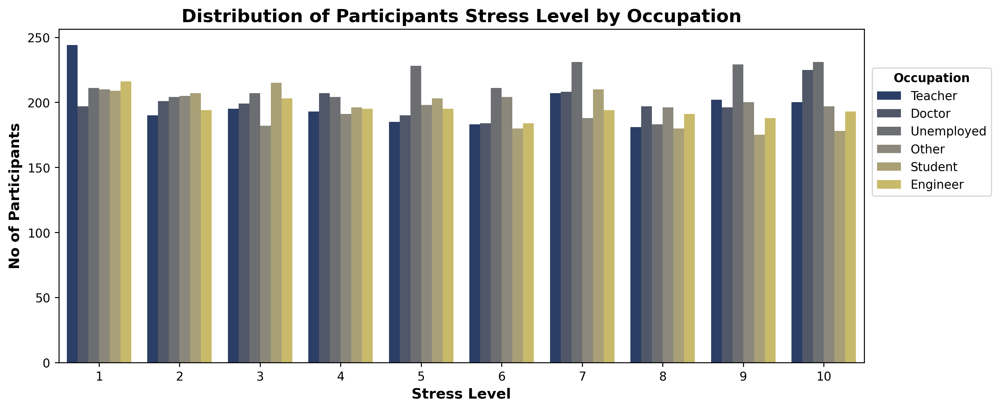

In [31]:
# Checking how does stress level vary among participants by occupation
ax = sns.countplot(
    data = df,
    x = 'stress_level',
    hue = 'occupation',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Stress Level by Occupation")
plt.xlabel("Stress Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

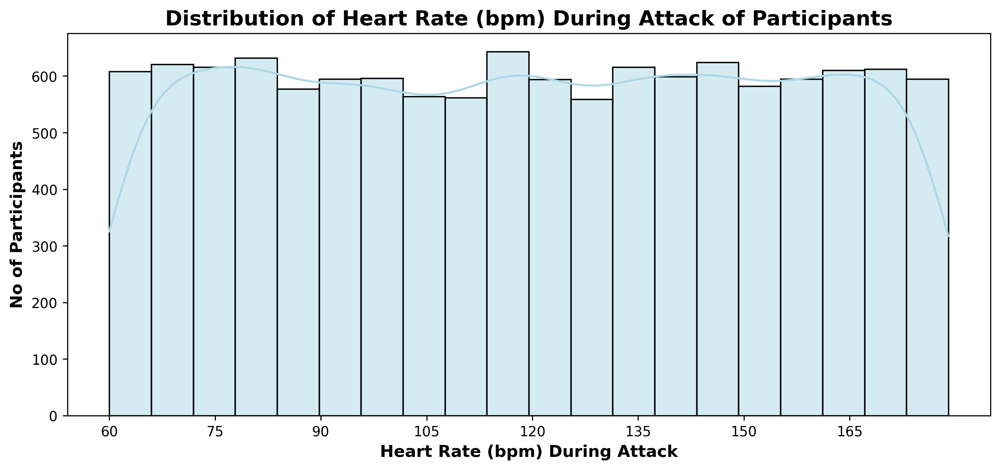

In [32]:
# Checking what is the distribution of heart rate among participants
sns.histplot(
    data = df, 
    x = 'heart_rate_bpm_during_attack',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Heart Rate (bpm) During Attack of Participants")
plt.xlabel("Heart Rate (bpm) During Attack")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['heart_rate_bpm_during_attack'].min())
max_value = round(df['heart_rate_bpm_during_attack'].max())
plt.xticks(range(min_value, max_value, 15));

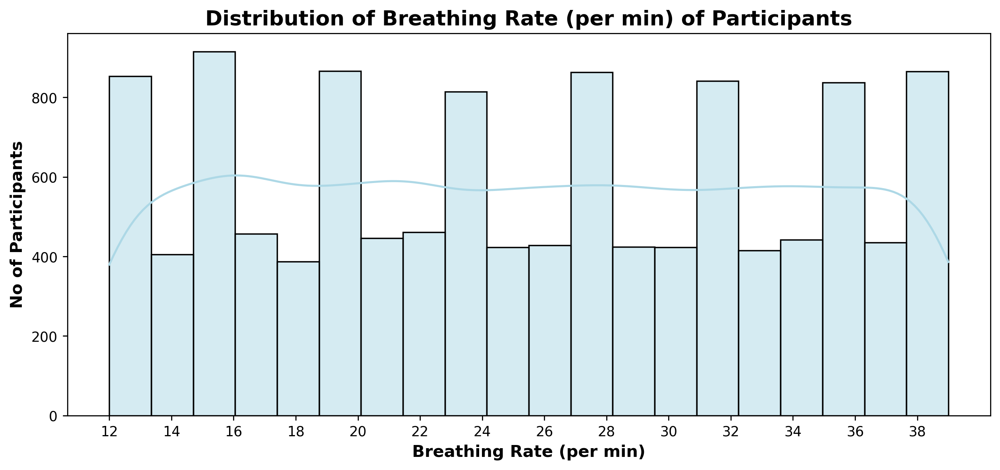

In [33]:
# Checking what is the distribution of breathing rate among participants
sns.histplot(
    data = df, 
    x = 'breathing_rate_breaths_min',
    bins = 20,
    kde = True,
    color = 'lightblue'
)

# Adding title and labels to the plot
plt.title("Distribution of Breathing Rate (per min) of Participants")
plt.xlabel("Breathing Rate (per min)")
plt.ylabel("No of Participants")

# Changing the values of xticks()
min_value = round(df['breathing_rate_breaths_min'].min())
max_value = round(df['breathing_rate_breaths_min'].max())
plt.xticks(range(min_value, max_value, 2));

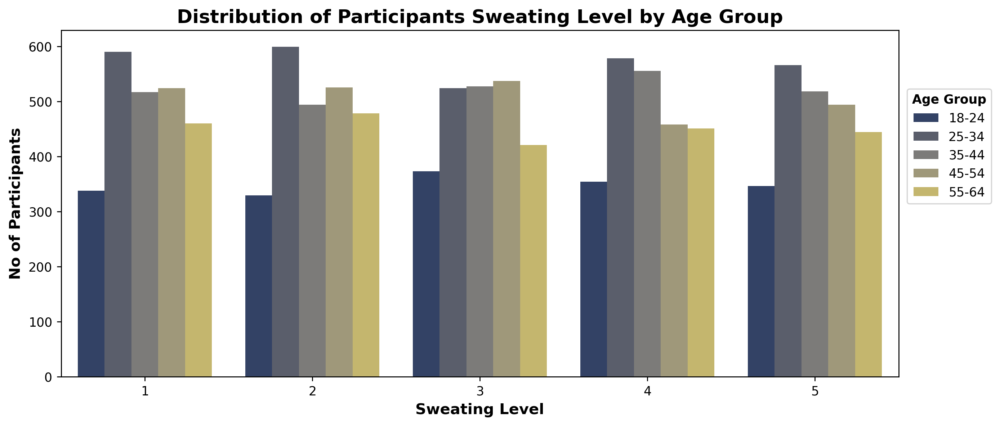

In [34]:
# Checking how does sweating level vary among participants by age group
ax = sns.countplot(
    data = df,
    x = 'sweating_level',
    hue = 'age_group',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Sweating Level by Age Group")
plt.xlabel("Sweating Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

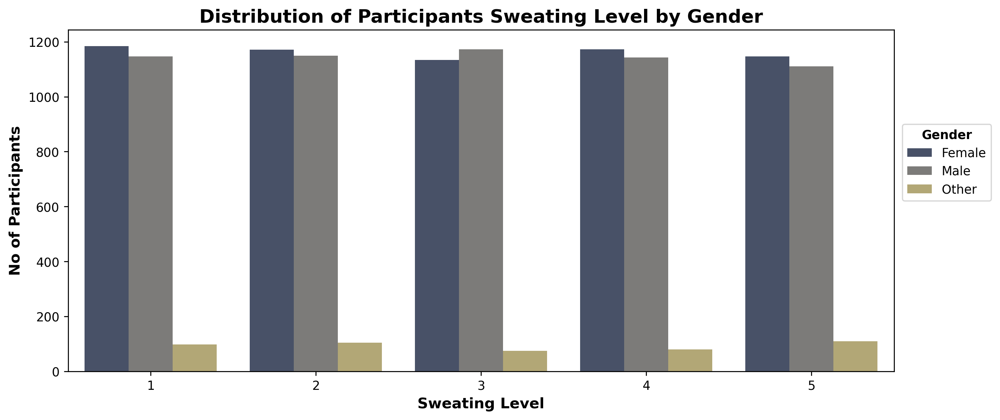

In [35]:
# Checking how does sweating level vary among participants by gender
ax = sns.countplot(
    data = df,
    x = 'sweating_level',
    hue = 'gender',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Sweating Level by Gender")
plt.xlabel("Sweating Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

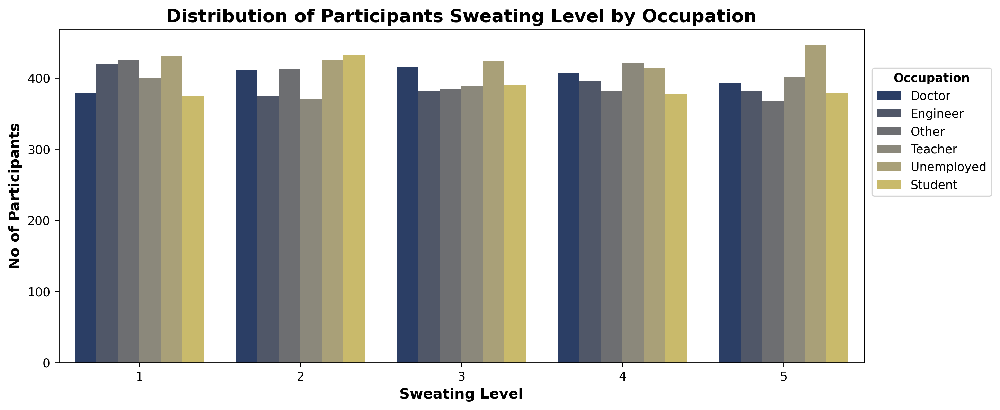

In [36]:
# Checking how does sweating level vary among participants by occupation
ax = sns.countplot(
    data = df,
    x = 'sweating_level',
    hue = 'occupation',
    palette = 'cividis'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Sweating Level by Occupation")
plt.xlabel("Sweating Level")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

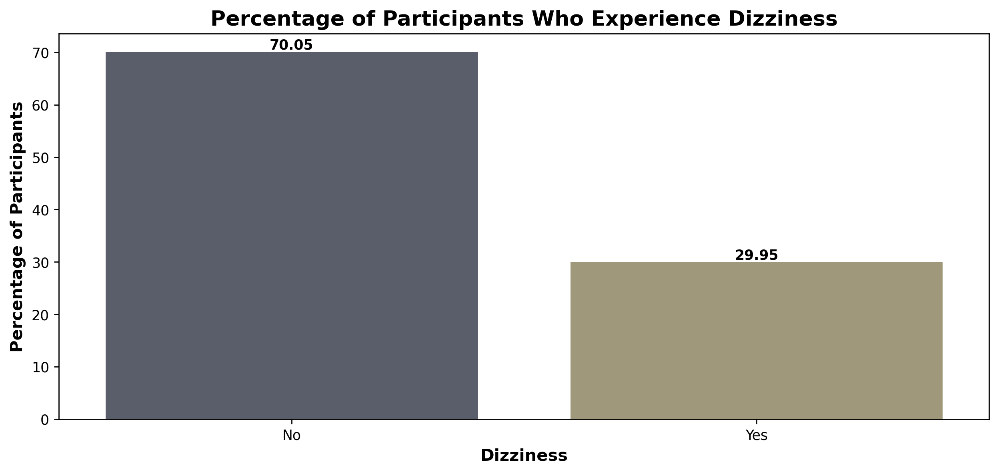

In [37]:
# Checking what percentage of participants experience dizziness during an attack
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'dizziness',
    hue = 'dizziness',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Experience Dizziness")
plt.xlabel("Dizziness")
plt.ylabel("Percentage of Participants");

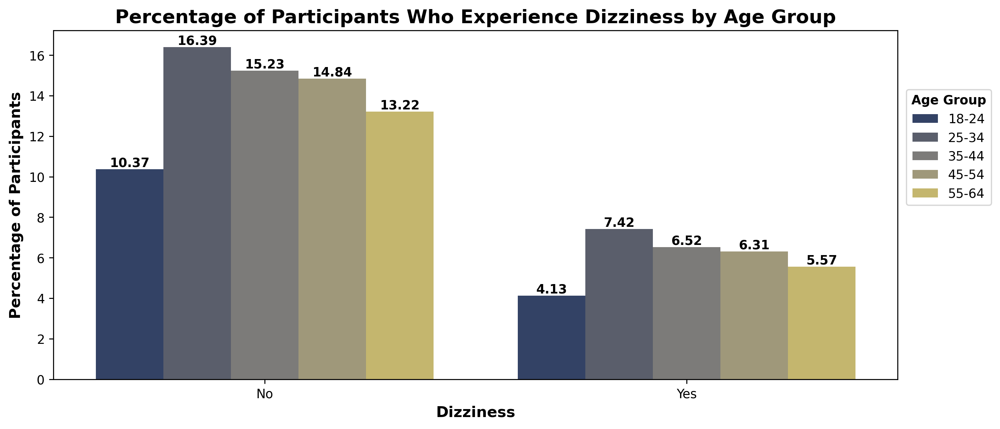

In [38]:
# Checking what percentage of participants experience dizziness during an attack by age group
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'dizziness',
    hue = 'age_group',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Experience Dizziness by Age Group")
plt.xlabel("Dizziness")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

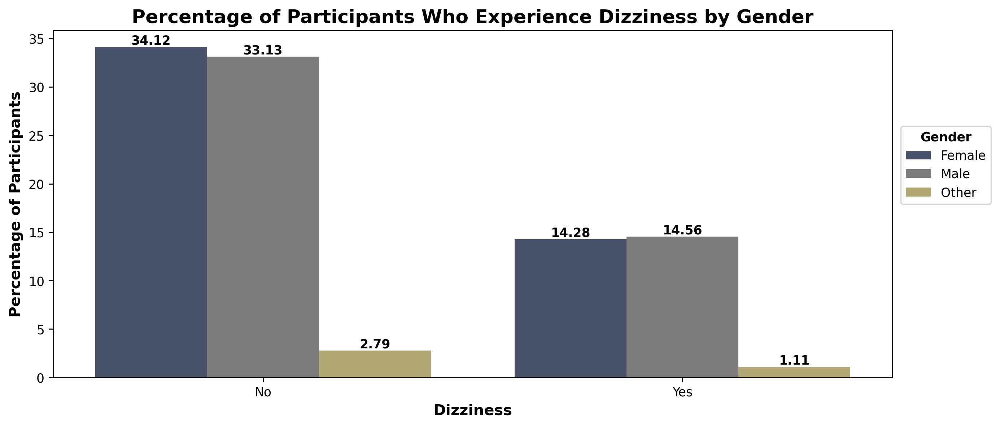

In [39]:
# Checking what percentage of participants experience dizziness during an attack by gender
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'dizziness',
    hue = 'gender',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Experience Dizziness by Gender")
plt.xlabel("Dizziness")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

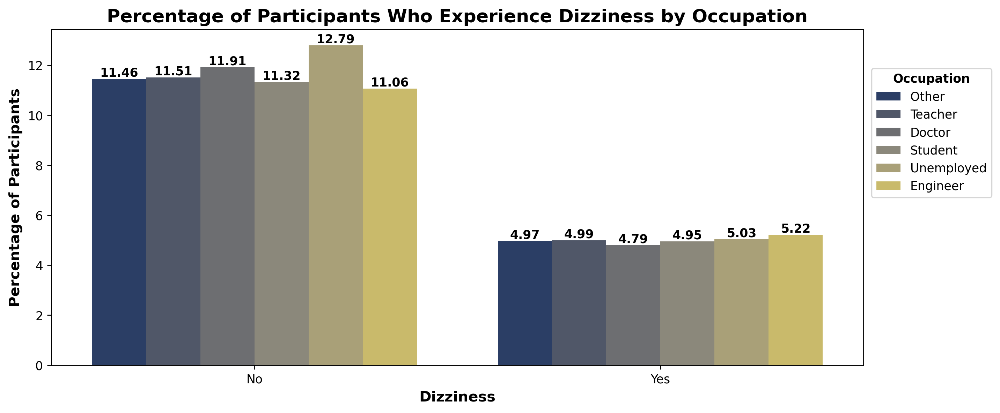

In [40]:
# Checking what percentage of participants experience dizziness during an attack by occupation
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'dizziness',
    hue = 'occupation',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Experience Dizziness by Occupation")
plt.xlabel("Dizziness")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

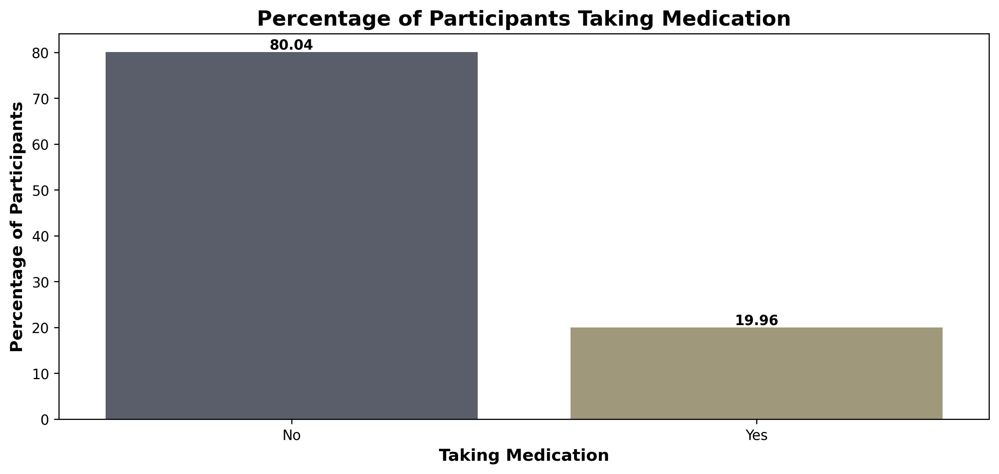

In [41]:
# Checking what percentage of participants are taking any kind of medication
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'medication',
    hue = 'medication',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Taking Medication")
plt.xlabel("Taking Medication")
plt.ylabel("Percentage of Participants");

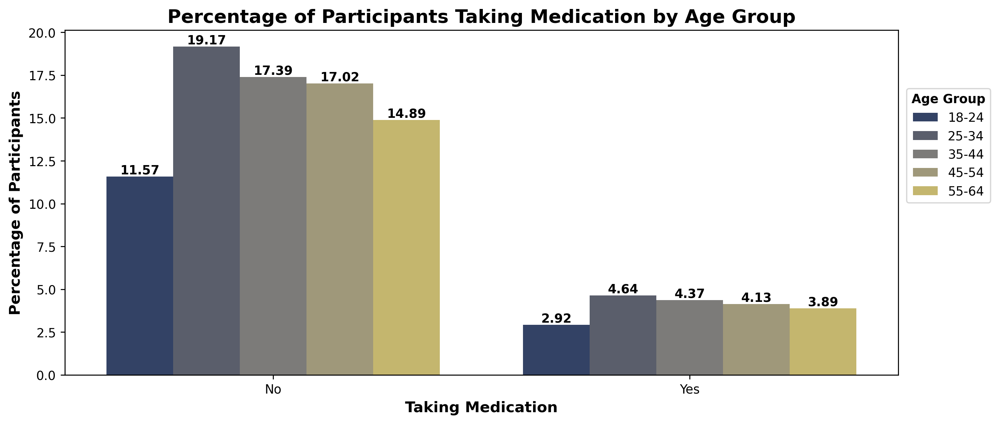

In [42]:
# Checking what percentage of participants are taking any kind of medication by age group
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'medication',
    hue = 'age_group',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Taking Medication by Age Group")
plt.xlabel("Taking Medication")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

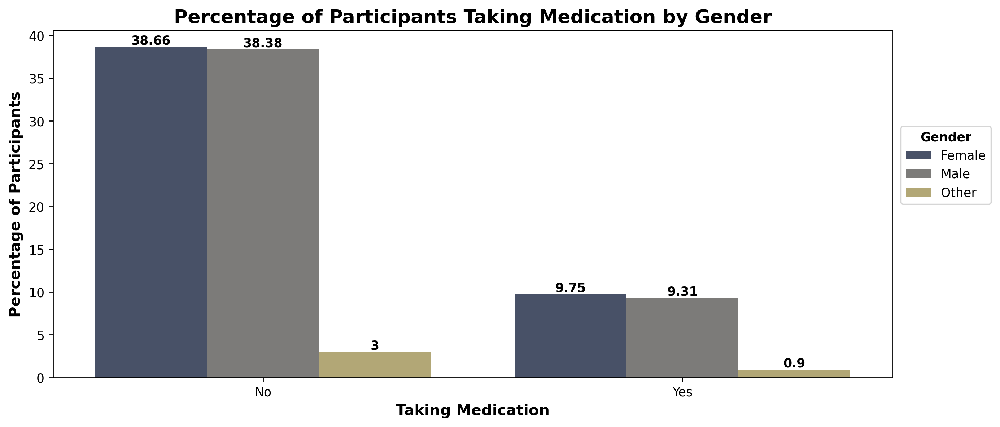

In [43]:
# Checking what percentage of participants are taking any kind of medication by gender
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'medication',
    hue = 'gender',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Taking Medication by Gender")
plt.xlabel("Taking Medication")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

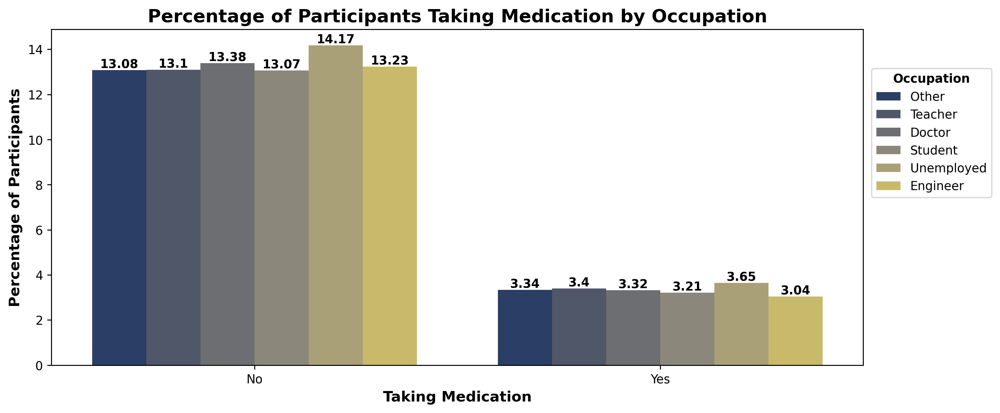

In [44]:
# Checking what percentage of participants are taking any kind of medication by occupation
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'medication',
    hue = 'occupation',
    palette = 'cividis',
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Taking Medication by Occupation")
plt.xlabel("Taking Medication")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

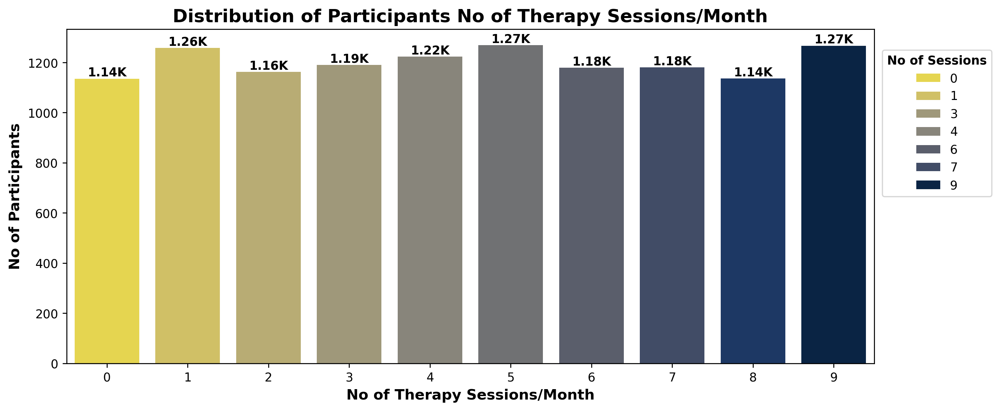

In [45]:
# Checking what is the distribution of therapy sessions per month
ax = sns.countplot(
    data = df,
    x = 'therapy_sessions_per_month',
    hue = 'therapy_sessions_per_month',
    palette = 'cividis_r'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants No of Therapy Sessions/Month")
plt.xlabel("No of Therapy Sessions/Month")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "No of Sessions", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

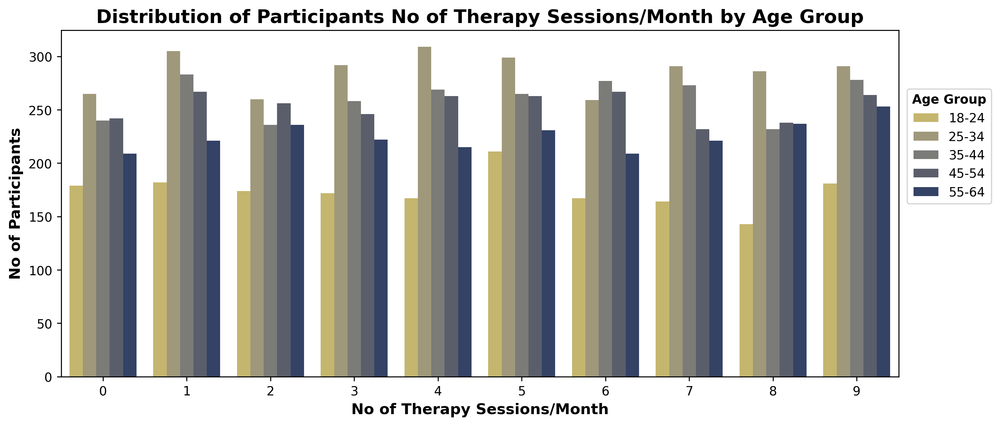

In [46]:
# Checking what is the distribution of therapy sessions per month by age group
ax = sns.countplot(
    data = df,
    x = 'therapy_sessions_per_month',
    hue = 'age_group',
    palette = 'cividis_r'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants No of Therapy Sessions/Month by Age Group")
plt.xlabel("No of Therapy Sessions/Month")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

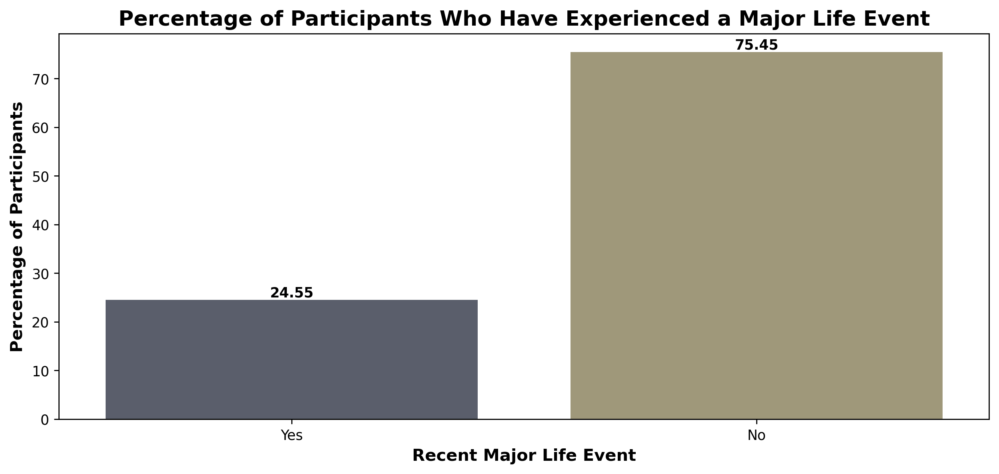

In [47]:
# Checking what percentage of participants have experienced a major life event recently
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'recent_major_life_event',
    hue = 'recent_major_life_event',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Have Experienced a Major Life Event")
plt.xlabel("Recent Major Life Event")
plt.ylabel("Percentage of Participants");

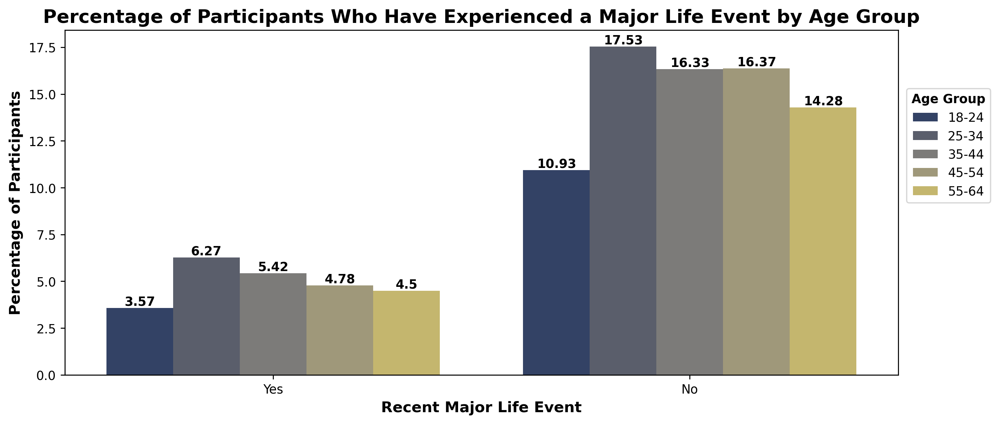

In [48]:
# Checking what percentage of participants have experienced a major life event recently by age group
ax = sns.countplot(
    data = df,
    stat = 'percent',
    x = 'recent_major_life_event',
    hue = 'age_group',
    palette = 'cividis'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Percentage of Participants Who Have Experienced a Major Life Event by Age Group")
plt.xlabel("Recent Major Life Event")
plt.ylabel("Percentage of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

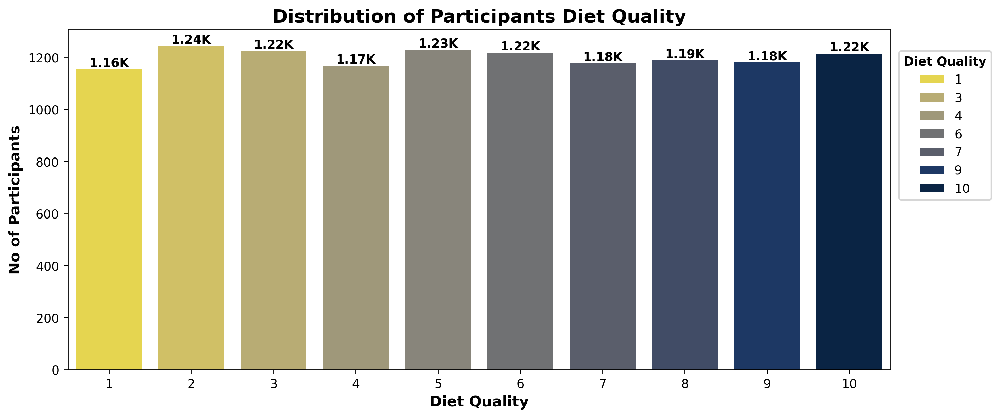

In [49]:
# Checking what is the distribution of diet quality among participants
ax = sns.countplot(
    data = df,
    x = 'diet_quality',
    hue = 'diet_quality',
    palette = 'cividis_r'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Participants Diet Quality")
plt.xlabel("Diet Quality")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Diet Quality", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

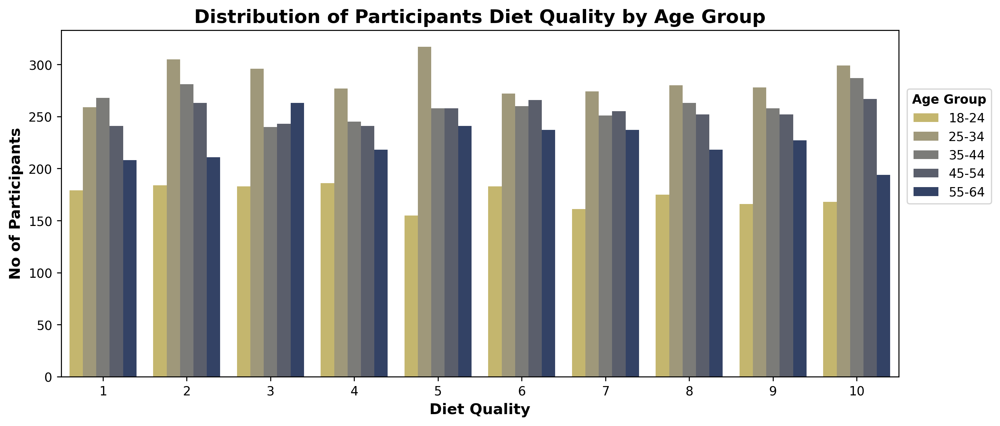

In [50]:
# Checking what is the distribution of diet quality among participants by age group
ax = sns.countplot(
    data = df,
    x = 'diet_quality',
    hue = 'age_group',
    palette = 'cividis_r'
)

# Adding title and labels to the plot
plt.title("Distribution of Participants Diet Quality by Age Group")
plt.xlabel("Diet Quality")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

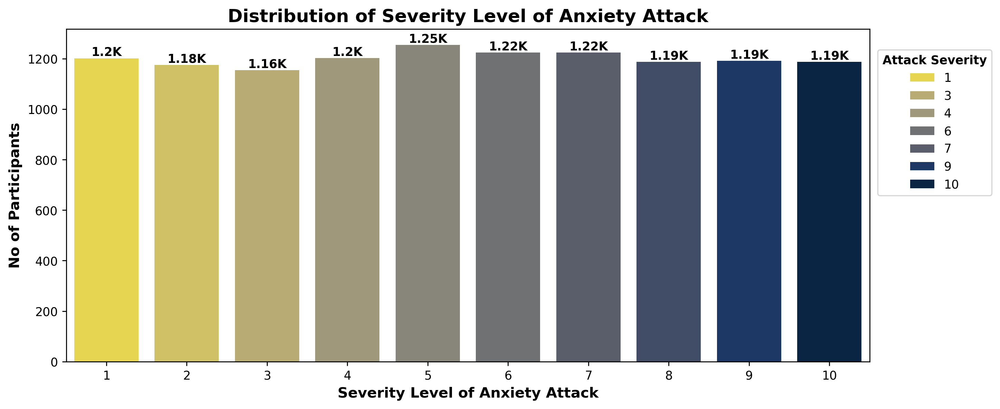

In [51]:
# Checking what is the distribution of anxiety attack severity levels
ax = sns.countplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    hue = 'severity_of_anxiety_attack',
    palette = 'cividis_r'
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Distribution of Severity Level of Anxiety Attack")
plt.xlabel("Severity Level of Anxiety Attack")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Attack Severity", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

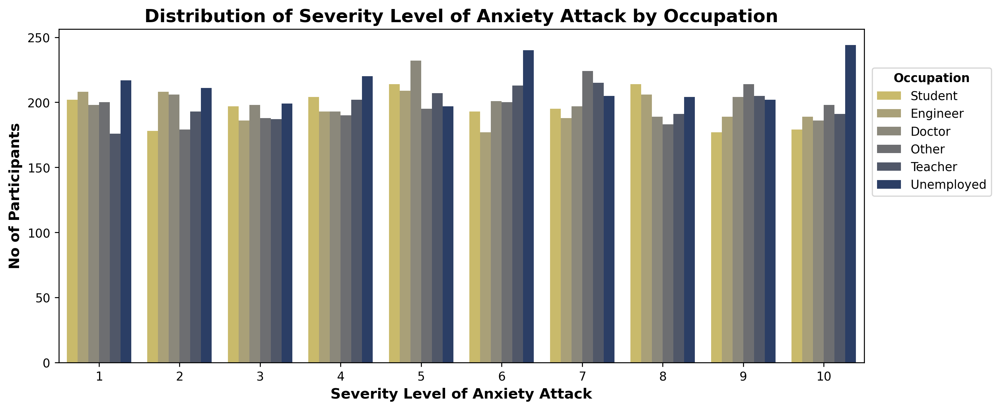

In [52]:
# Checking what is the distribution of anxiety attack severity levels by occupation
ax = sns.countplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    hue = 'occupation',
    palette = 'cividis_r'
)

# Adding title and labels to the plot
plt.title("Distribution of Severity Level of Anxiety Attack by Occupation")
plt.xlabel("Severity Level of Anxiety Attack")
plt.ylabel("No of Participants")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

---

### **Converting Severity of Anxiety Attack Column to Categorical Column**

In [53]:
# Bins and labels for severity of anxiety attack column
anxiety_severity_bins = [0, 3, 7, 10]       #   0-3      4-7     8-10
anxiety_severity_labels = ['L', 'M', 'H']   # ['Low', 'Medium', 'High']

In [54]:
# Calling a function to convert the severity of anxiety column into categorical column
df = convert_to_categories(df, 'severity_of_anxiety_attack', bins = anxiety_severity_bins, labels = anxiety_severity_labels, replace=True)
df.head()

,participant_id,age,gender,occupation,sleep_duration_hrs_night,physical_activity_hrs_week,caffeine_intake_mg_day,alcohol_consumption_drinks_week,smoking_status,family_history_of_anxiety,stress_level,heart_rate_bpm_during_attack,breathing_rate_breaths_min,sweating_level,dizziness,medication,therapy_sessions_per_month,recent_major_life_event,diet_quality,severity_of_anxiety_attack,age_group
0,1,56,Female,Other,9.6,8.3,175,6,No,No,4,145,33,3,No,No,4,Yes,9,H,55-64
1,2,46,Male,Teacher,6.4,7.3,97,6,No,No,3,143,18,5,Yes,No,0,No,9,H,45-54
2,3,32,Female,Doctor,6.9,1.0,467,14,No,No,2,60,34,1,No,No,7,Yes,10,M,25-34
3,4,60,Male,Doctor,9.2,3.7,471,16,No,Yes,6,94,19,1,No,Yes,4,Yes,5,H,55-64
4,5,25,Male,Student,9.2,2.5,364,2,No,Yes,7,152,15,4,No,Yes,0,No,1,L,25-34


---

### ***<u>Correlation & Relationships</u>***

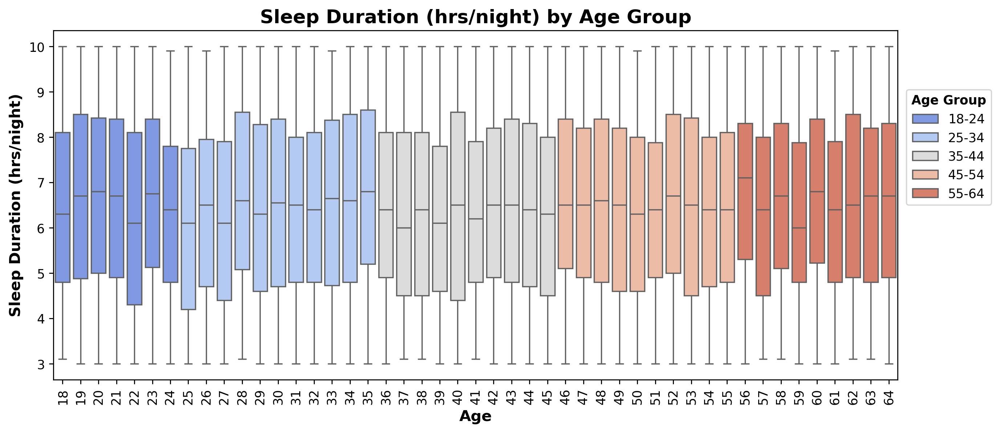

In [55]:
# Checking how does sleep duration vary across different age groups
sns.boxplot(
    data = df,
    x = 'age',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration (hrs/night) by Age Group")
plt.xlabel("Age")
plt.ylabel("Sleep Duration (hrs/night)")

# Rotating the xticks
plt.xticks(rotation = 90)

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

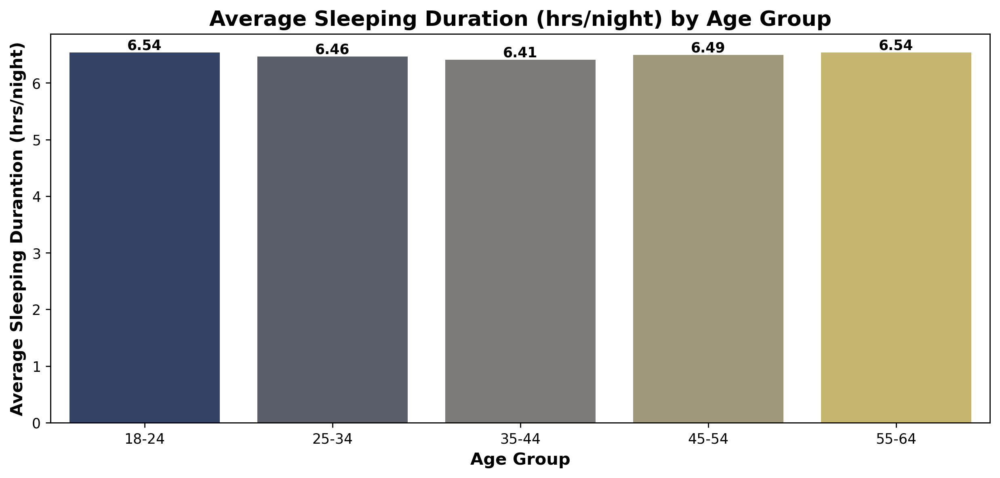

In [56]:
# Checking how does the average sleep duration vary across different age groups
ax = sns.barplot(
    data = df,
    x = 'age_group',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'cividis',
    errorbar=None
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Average Sleeping Duration (hrs/night) by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Average Sleeping Durantion (hrs/night)");

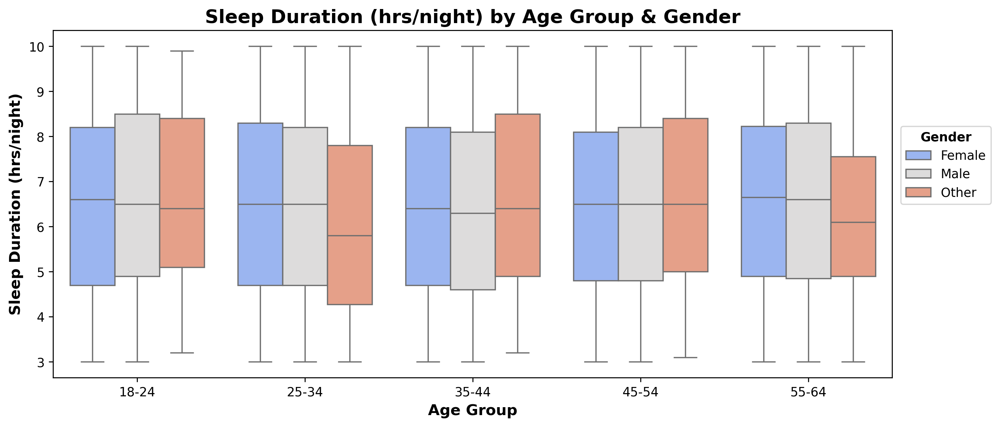

In [57]:
# Checking how does sleep duration differ by age group and gender
sns.boxplot(
    data = df,
    x = 'age_group',
    y = 'sleep_duration_hrs_night',
    hue = 'gender',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration (hrs/night) by Age Group & Gender")
plt.xlabel("Age Group")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

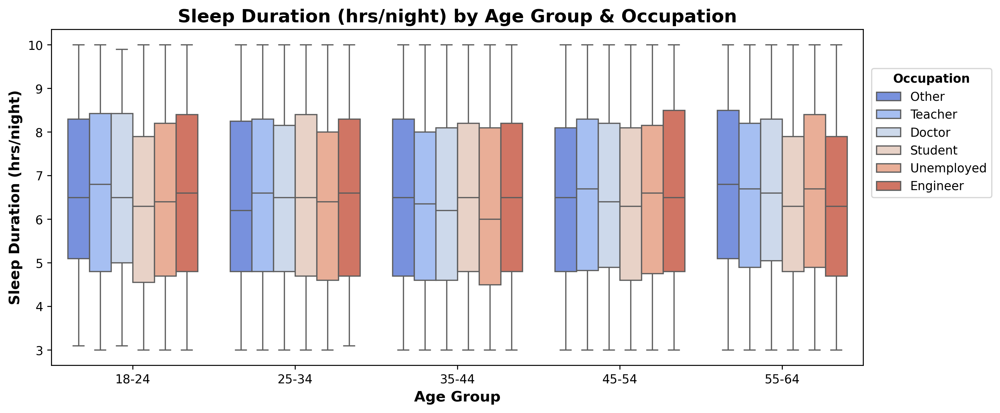

In [58]:
# Checking how does sleep duration vary by age group and occupation
sns.boxplot(
    data = df,
    x = 'age_group',
    y = 'sleep_duration_hrs_night',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration (hrs/night) by Age Group & Occupation")
plt.xlabel("Age Group")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

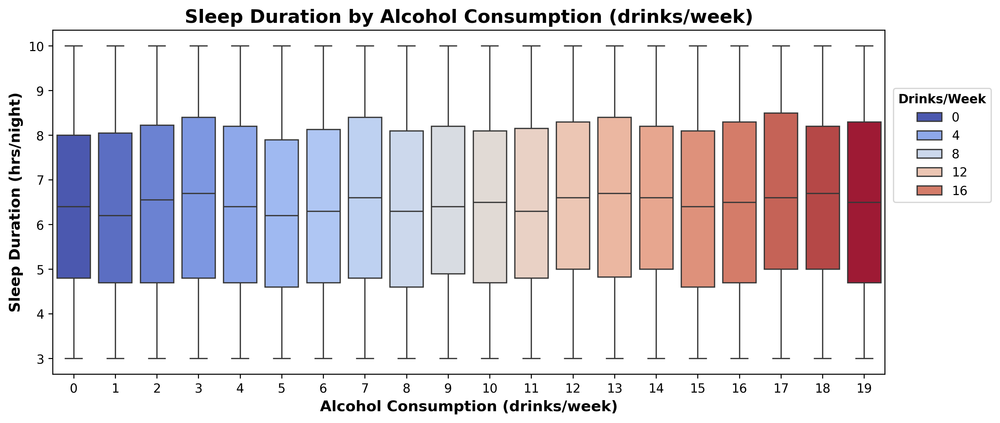

In [59]:
# Checking how does alcohol consumption affects sleep duration
sns.boxplot(
    data = df,
    x = 'alcohol_consumption_drinks_week',
    y = 'sleep_duration_hrs_night',
    hue = 'alcohol_consumption_drinks_week',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Alcohol Consumption (drinks/week)")
plt.xlabel("Alcohol Consumption (drinks/week)")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Drinks/Week", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

---

### **Converting Caffeine Intake (mg/day) Column to Categorical Column**

In [60]:
# Bins and labels for severity of anxiety attack column
caffeine_intake_bins = [1, 100, 200, 300, 400, 500]    # [1-100)  [100-200)  [200-300)  [300-400)  [400-500]
caffeine_intake_labels = ['VL', 'L', 'M', 'H', 'VH']   # ['Very Low', 'Low', 'Moderate', 'High', 'Very High']

In [61]:
# Calling a function to convert the severity of anxiety column into categorical column
df = convert_to_categories(df, 'caffeine_intake_mg_day', bins = caffeine_intake_bins, labels = caffeine_intake_labels, replace=False)
df.head()

,participant_id,age,gender,occupation,sleep_duration_hrs_night,physical_activity_hrs_week,caffeine_intake_mg_day,alcohol_consumption_drinks_week,smoking_status,family_history_of_anxiety,stress_level,heart_rate_bpm_during_attack,breathing_rate_breaths_min,sweating_level,dizziness,medication,therapy_sessions_per_month,recent_major_life_event,diet_quality,severity_of_anxiety_attack,age_group,caffeine_intake_mg_day_binned
0,1,56,Female,Other,9.6,8.3,175,6,No,No,4,145,33,3,No,No,4,Yes,9,H,55-64,L
1,2,46,Male,Teacher,6.4,7.3,97,6,No,No,3,143,18,5,Yes,No,0,No,9,H,45-54,VL
2,3,32,Female,Doctor,6.9,1.0,467,14,No,No,2,60,34,1,No,No,7,Yes,10,M,25-34,VH
3,4,60,Male,Doctor,9.2,3.7,471,16,No,Yes,6,94,19,1,No,Yes,4,Yes,5,H,55-64,VH
4,5,25,Male,Student,9.2,2.5,364,2,No,Yes,7,152,15,4,No,Yes,0,No,1,L,25-34,H


In [62]:
# Checking if we have any null values in the the df
df.isnull().sum()

participant_id                     0
age                                0
gender                             0
occupation                         0
sleep_duration_hrs_night           0
physical_activity_hrs_week         0
caffeine_intake_mg_day             0
alcohol_consumption_drinks_week    0
smoking_status                     0
family_history_of_anxiety          0
stress_level                       0
heart_rate_bpm_during_attack       0
breathing_rate_breaths_min         0
sweating_level                     0
dizziness                          0
medication                         0
therapy_sessions_per_month         0
recent_major_life_event            0
diet_quality                       0
severity_of_anxiety_attack         0
age_group                          0
caffeine_intake_mg_day_binned      0
dtype: int64

---

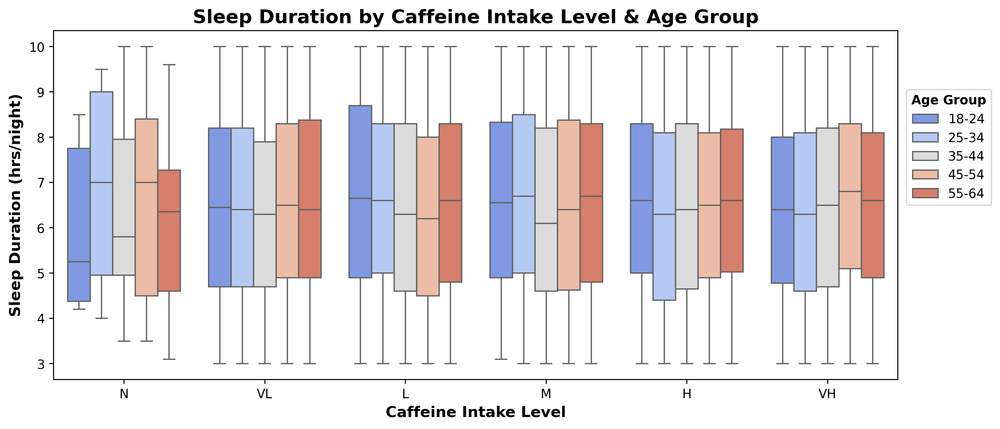

In [63]:
# Checking how does caffeine intake affects sleep duration of pariticipants of different age group
sns.boxplot(
    data = df,
    x = 'caffeine_intake_mg_day_binned',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Caffeine Intake Level & Age Group")
plt.xlabel("Caffeine Intake Level")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

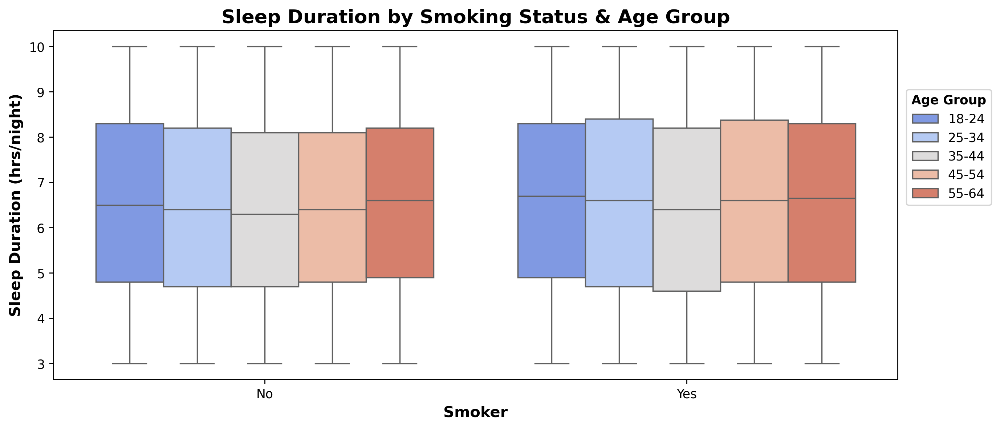

In [64]:
# Checking hoes smoking affect sleep duration of pariticipants of different age group
sns.boxplot(
    data = df,
    x = 'smoking_status',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Smoking Status & Age Group")
plt.xlabel("Smoker")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

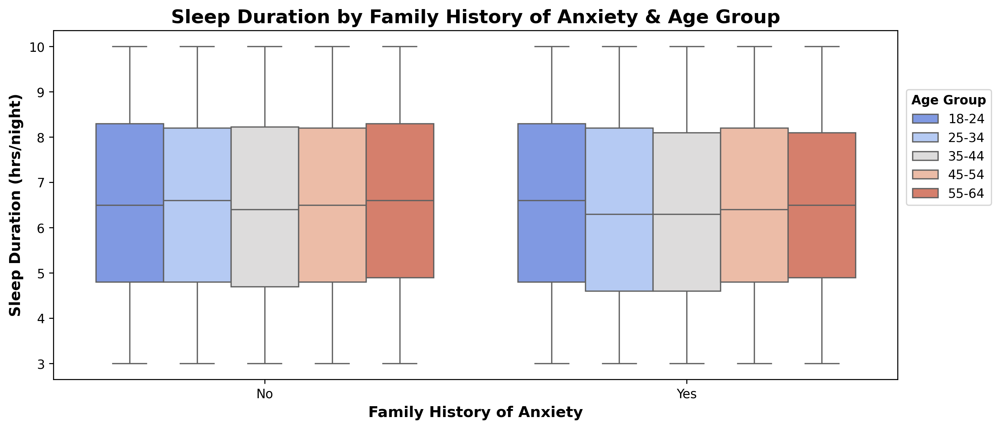

In [65]:
# Checking how does a family history of anxiety influence sleep duration of pariticipants of different age group
sns.boxplot(
    data = df,
    x = 'family_history_of_anxiety',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Family History of Anxiety & Age Group")
plt.xlabel("Family History of Anxiety")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

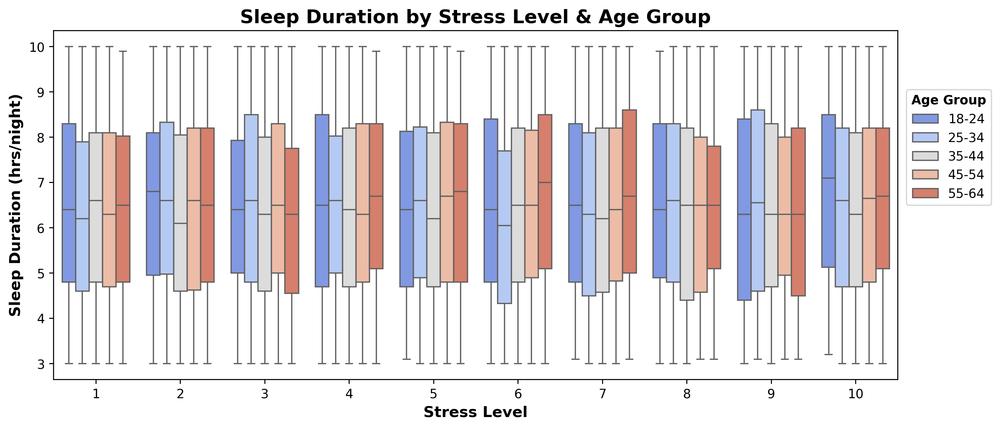

In [66]:
# Checking how does stress level influence sleep duration of pariticipants of different age group
sns.boxplot(
    data = df,
    x = 'stress_level',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Stress Level & Age Group")
plt.xlabel("Stress Level")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

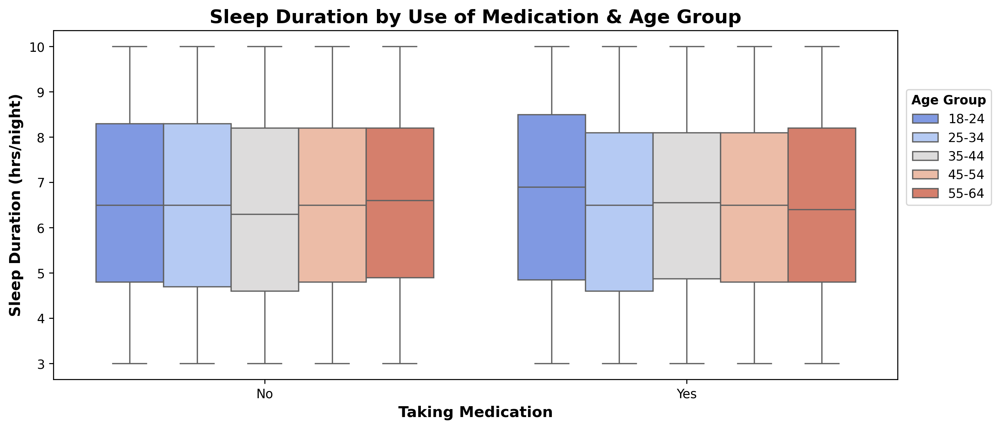

In [67]:
# Checking how does taking medication influence sleep duration of pariticipants of different age group
sns.boxplot(
    data = df,
    x = 'medication',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Use of Medication & Age Group")
plt.xlabel("Taking Medication")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

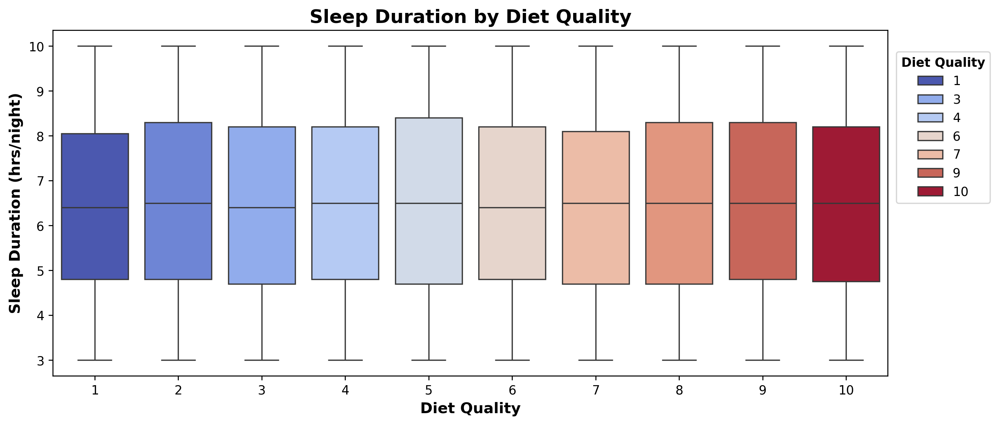

In [68]:
# Checking how does diet quality affect sleep duration
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'sleep_duration_hrs_night',
    hue = 'diet_quality',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Diet Quality")
plt.xlabel("Diet Quality")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Diet Quality", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

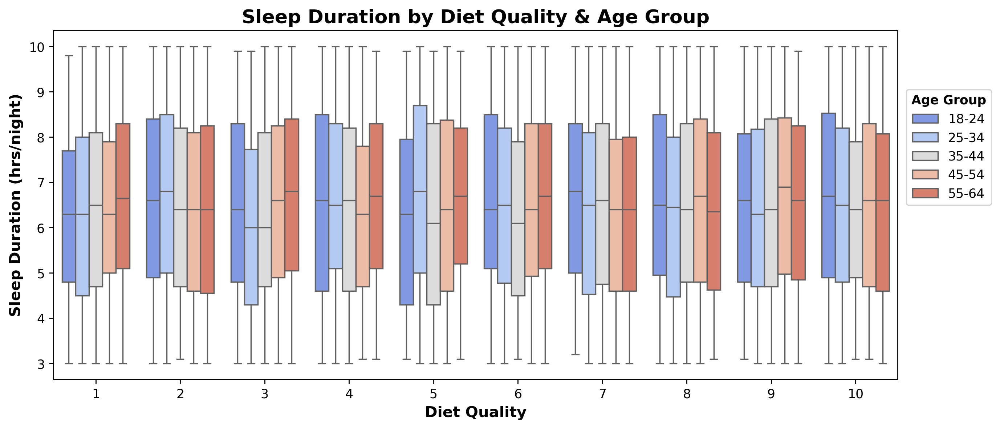

In [69]:
# Checking how does diet quality affect sleep duration of participants of different age group
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Diet Quality & Age Group")
plt.xlabel("Diet Quality")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

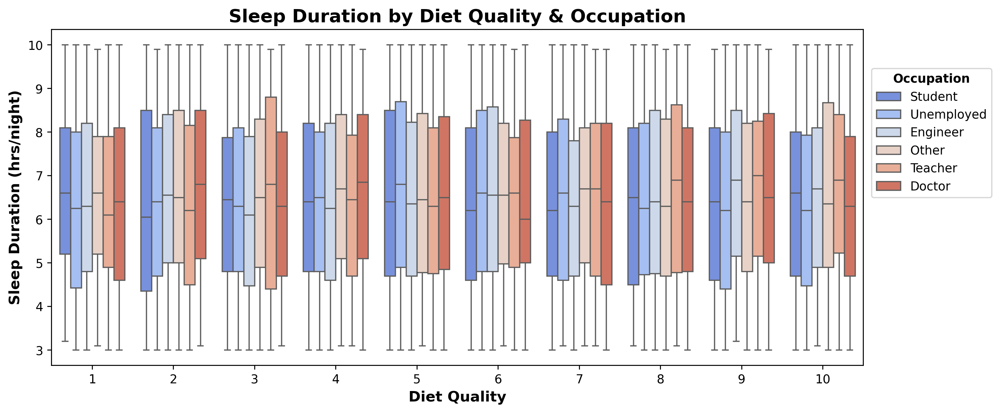

In [70]:
# Checking how does diet quality affect sleep duration of participants with different occupation
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'sleep_duration_hrs_night',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Diet Quality & Occupation")
plt.xlabel("Diet Quality")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

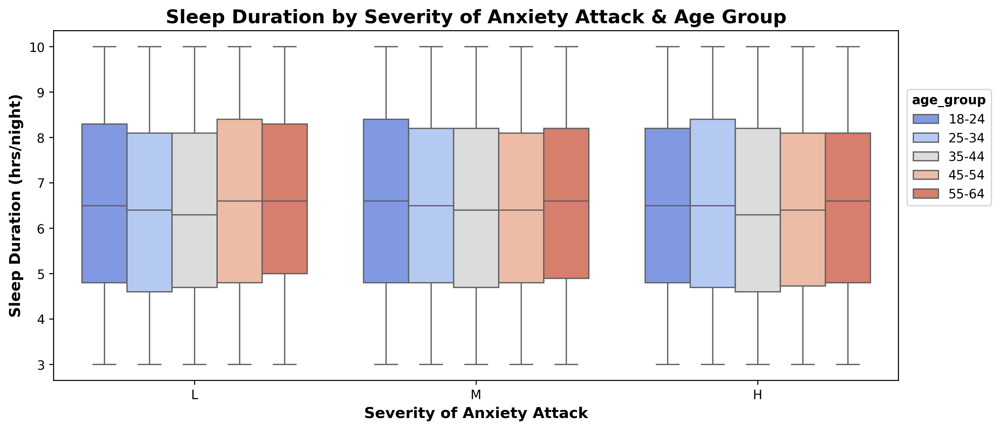

In [71]:
# Checking how does anxiety attack severity correlate with sleep duration
sns.boxplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    y = 'sleep_duration_hrs_night',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Sleep Duration by Severity of Anxiety Attack & Age Group")
plt.xlabel("Severity of Anxiety Attack")
plt.ylabel("Sleep Duration (hrs/night)")

# Setting the location of the legend
plt.legend(title = "age_group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

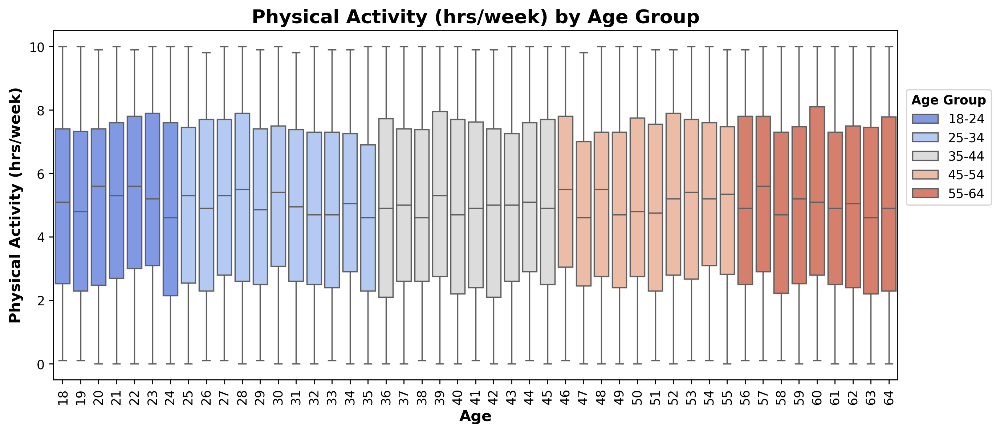

In [72]:
# Checking how does physical activity vary across different age groups
sns.boxplot(
    data = df,
    x = 'age',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Age Group")
plt.xlabel("Age")
plt.ylabel("Physical Activity (hrs/week)")

# Rotating the xticks
plt.xticks(rotation = 90)

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

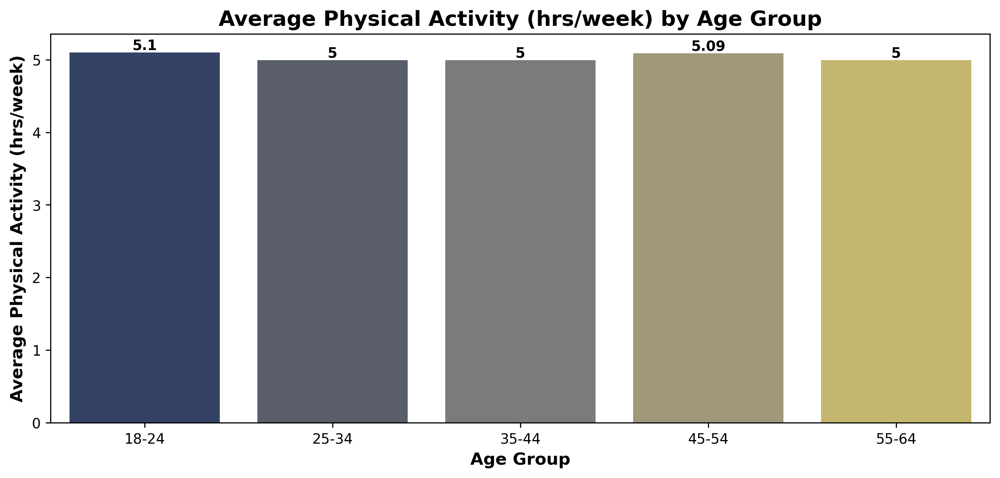

In [73]:
# Checking how does the average duration of physical activity vary across different age groups
ax = sns.barplot(
    data = df,
    x = 'age_group',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'cividis',
    errorbar=None
)

# Annotating bars
annotate_bars(ax)

# Adding title and labels to the plot
plt.title("Average Physical Activity (hrs/week) by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Average Physical Activity (hrs/week)");

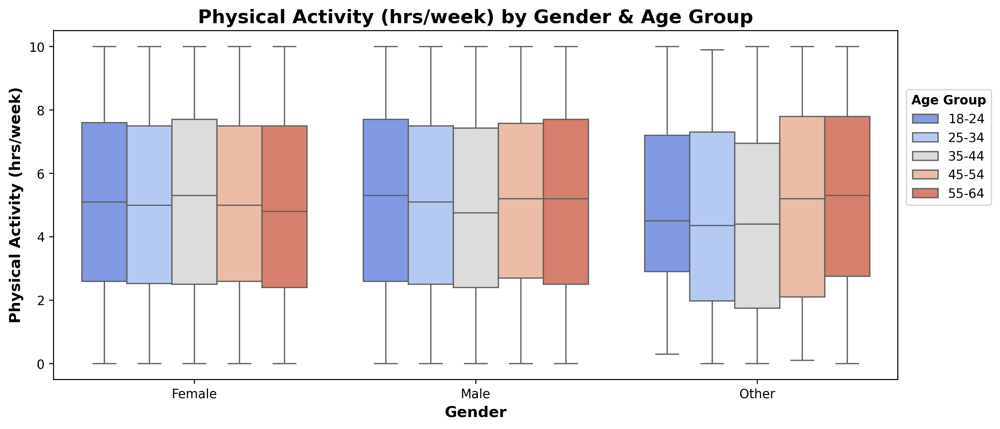

In [74]:
# Checking hoes gender influence physical activity levels of different age group
sns.boxplot(
    data = df,
    x = 'gender',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Gender & Age Group")
plt.xlabel("Gender")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

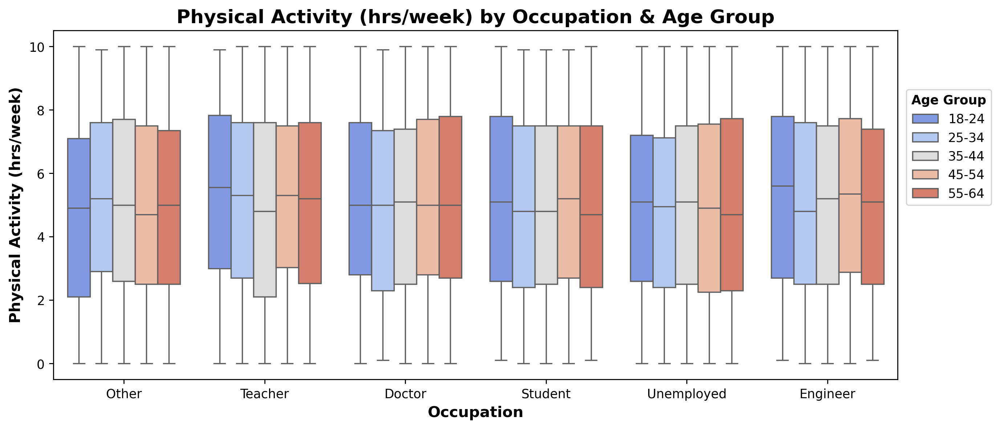

In [75]:
# Checking how does occupation influence physical activity levels of different age group
sns.boxplot(
    data = df,
    x = 'occupation',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Occupation & Age Group")
plt.xlabel("Occupation")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

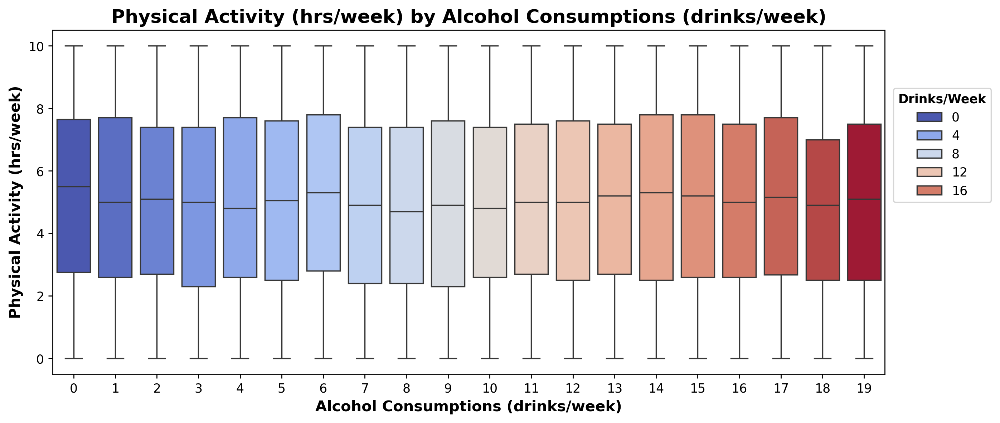

In [76]:
# Checking how does alcohol consumption impact physical activity levels
sns.boxplot(
    data = df,
    x = 'alcohol_consumption_drinks_week',
    y = 'physical_activity_hrs_week',
    hue = 'alcohol_consumption_drinks_week',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Alcohol Consumptions (drinks/week)")
plt.xlabel("Alcohol Consumptions (drinks/week)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Drinks/Week", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

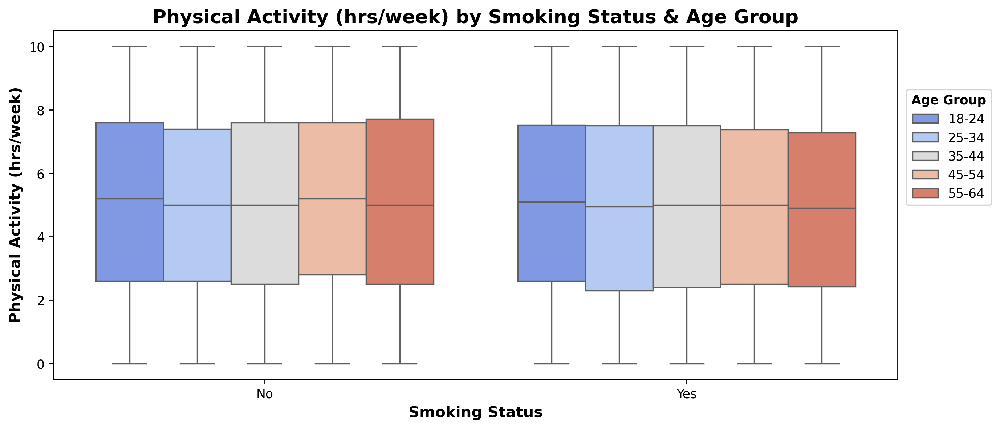

In [77]:
# Checking how does smoking status influence physical activity of different age group
sns.boxplot(
    data = df,
    x = 'smoking_status',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Smoking Status & Age Group")
plt.xlabel("Smoking Status")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

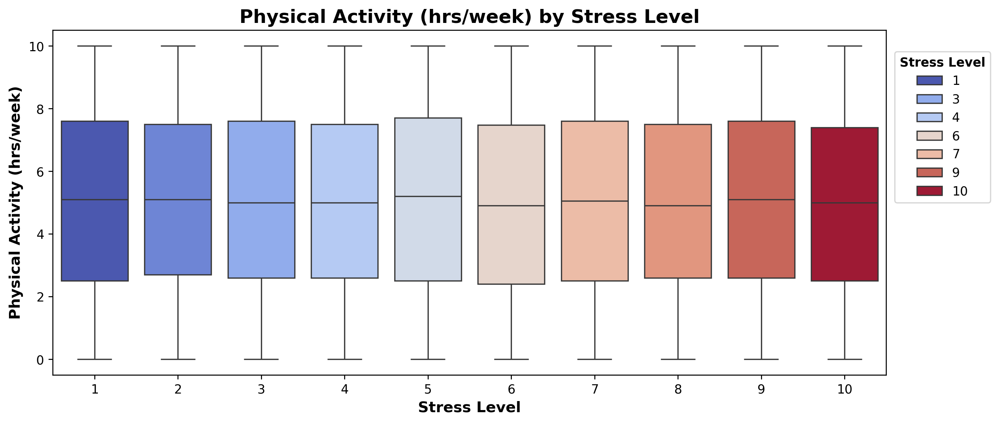

In [78]:
# Checking how does stress level impact physical activity
sns.boxplot(
    data = df,
    x = 'stress_level',
    y = 'physical_activity_hrs_week',
    hue = 'stress_level',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Stress Level")
plt.xlabel("Stress Level")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Stress Level", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

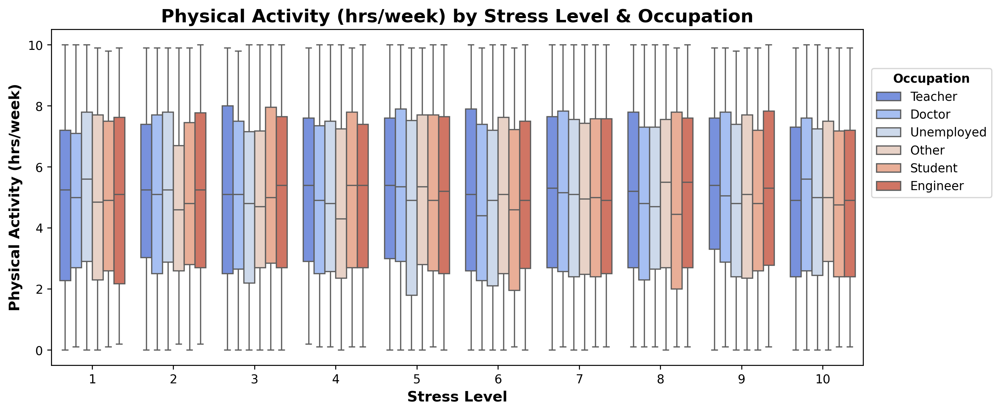

In [79]:
# Checking how does stress level impact physical activity of participants with different occupation
sns.boxplot(
    data = df,
    x = 'stress_level',
    y = 'physical_activity_hrs_week',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Stress Level & Occupation")
plt.xlabel("Stress Level")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

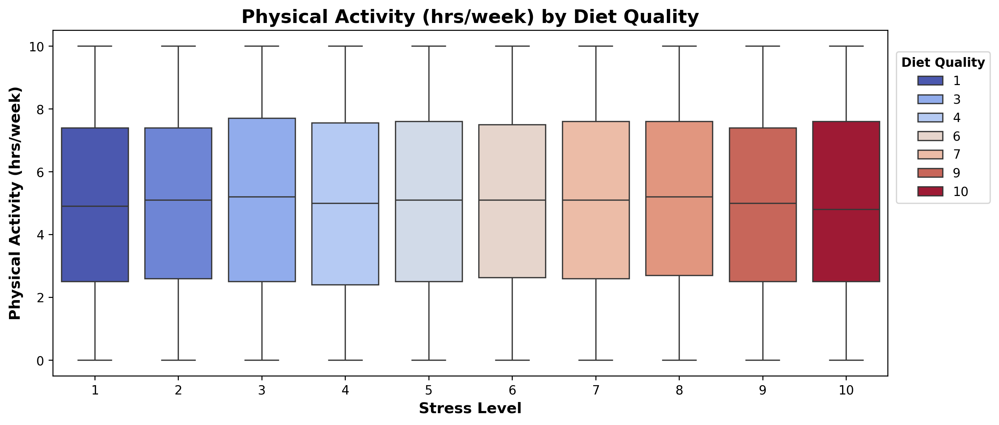

In [80]:
# Checking how does diet quality impact physical activity levels
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'physical_activity_hrs_week',
    hue = 'diet_quality',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Diet Quality")
plt.xlabel("Stress Level")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Diet Quality", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

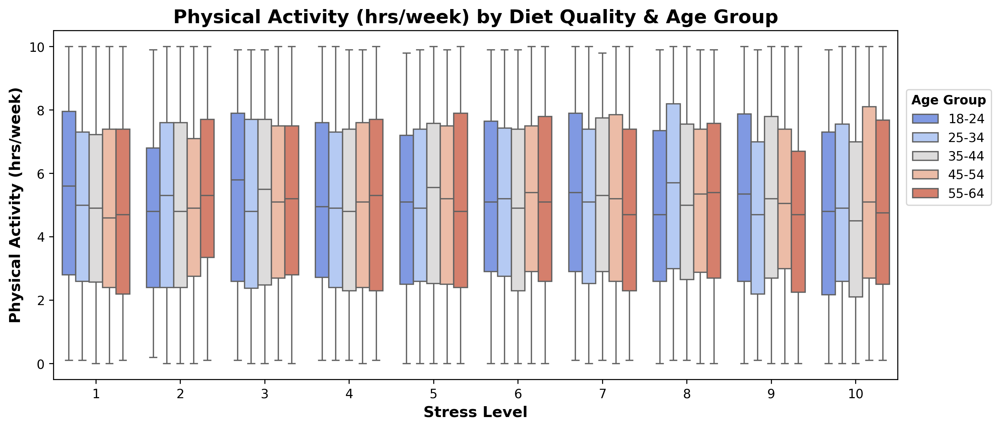

In [81]:
# Checking how does diet quality impact physical activity levels of different age groups
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Diet Quality & Age Group")
plt.xlabel("Stress Level")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

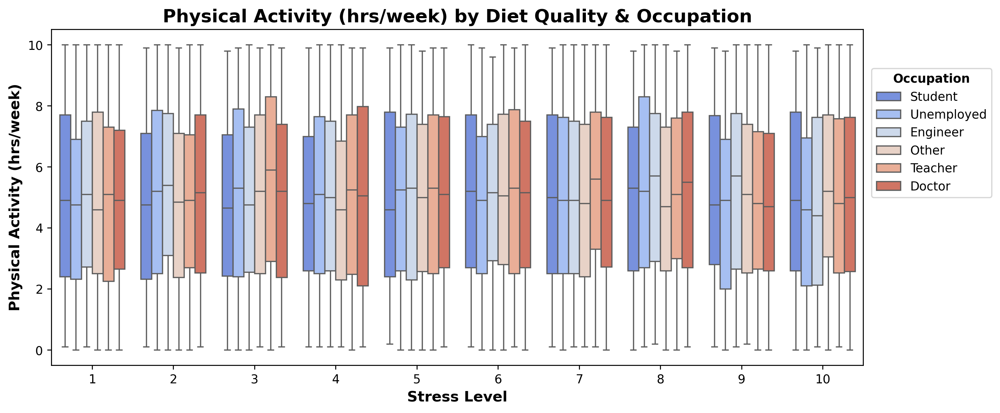

In [82]:
# Checking how does diet quality impact physical activity levels of participants with different occupations
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'physical_activity_hrs_week',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Diet Quality & Occupation")
plt.xlabel("Stress Level")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

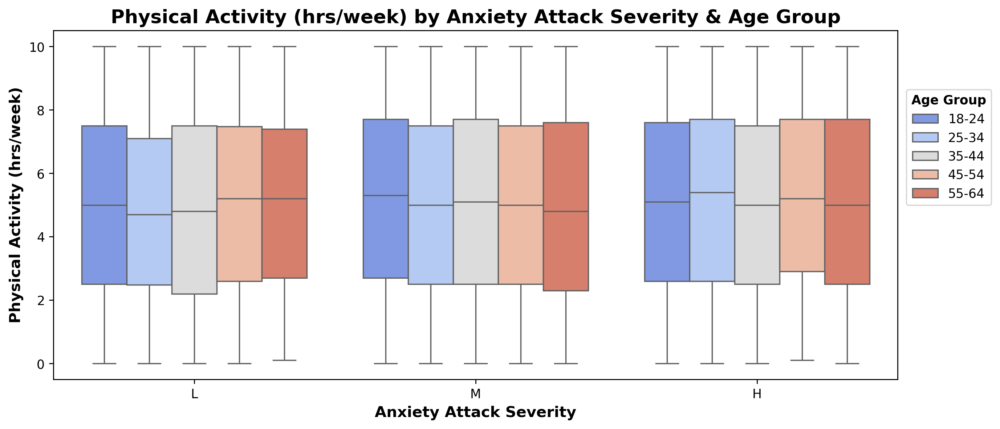

In [83]:
# Checking how does anxiety attack severity correlate with physical activity levels of different age groups
sns.boxplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Anxiety Attack Severity & Age Group")
plt.xlabel("Anxiety Attack Severity")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

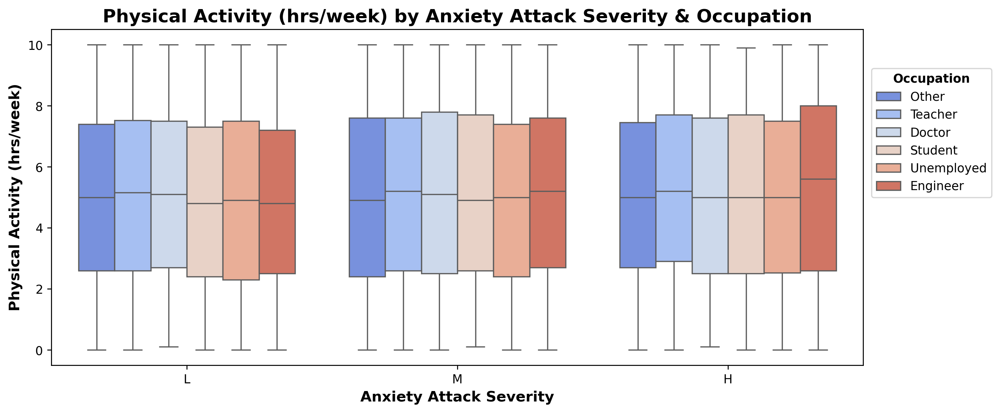

In [84]:
# Checking how does anxiety attack severity correlate with physical activity levels of participants with different occupation
sns.boxplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    y = 'physical_activity_hrs_week',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Physical Activity (hrs/week) by Anxiety Attack Severity & Occupation")
plt.xlabel("Anxiety Attack Severity")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

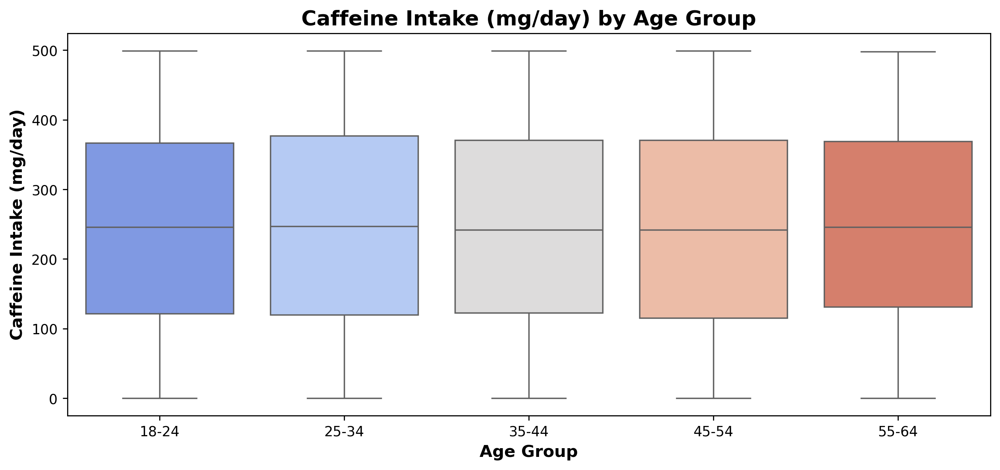

In [85]:
# Checking how does caffeine intake vary across different age groups
sns.boxplot(
    data = df,
    x = 'age_group',
    y = 'caffeine_intake_mg_day',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Caffeine Intake (mg/day)");

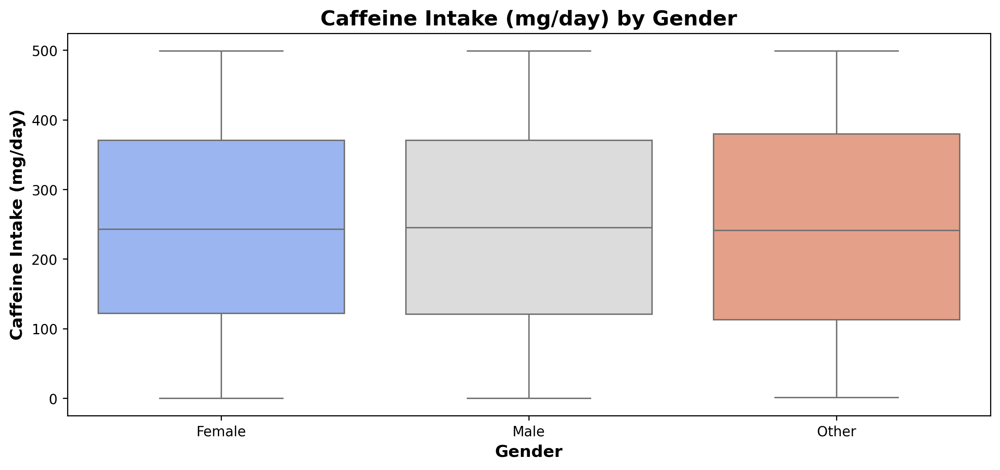

In [86]:
# Checking how does caffeine intake vary across different gender
sns.boxplot(
    data = df,
    x = 'gender',
    y = 'caffeine_intake_mg_day',
    hue = 'gender',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Gender")
plt.xlabel("Gender")
plt.ylabel("Caffeine Intake (mg/day)");

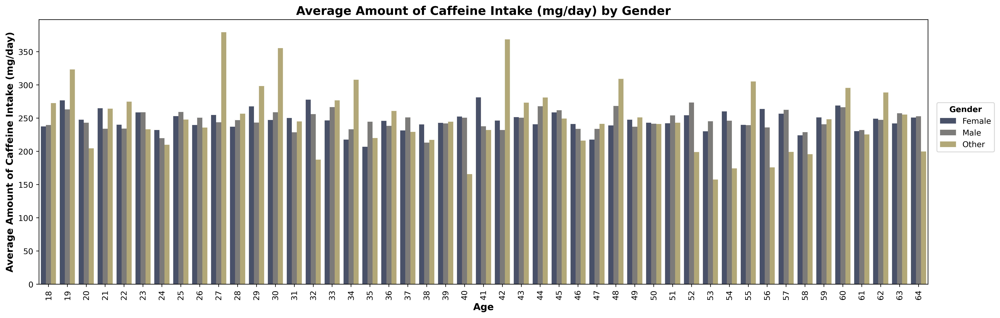

In [87]:
# Setting the plot size
plt.figure(figsize = (20, 6), dpi = 400)

# Checking what is the average amount of caffeine taken by people of different age by gender
ax = sns.barplot(
    data = df,
    x = 'age',
    y = 'caffeine_intake_mg_day',
    hue = 'gender',
    palette = 'cividis',
    errorbar=None
)

# Adding title and labels to the plot
plt.title("Average Amount of Caffeine Intake (mg/day) by Gender")
plt.xlabel("Age")
plt.ylabel("Average Amount of Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight': 'bold'})
plt.xticks(rotation = 90);

In [ ]:
# Checking how does caffeine intake vary across different occupations
sns.boxplot(
    data = df,
    x = 'occupation',
    y = 'caffeine_intake_mg_day',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Occupation")
plt.xlabel("Occupation")
plt.ylabel("Caffeine Intake (mg/day)");

In [ ]:
# Checking how does caffeine intake vary with alcohol consumption
sns.boxplot(
    data = df,
    x = 'alcohol_consumption_drinks_week',
    y = 'caffeine_intake_mg_day',
    hue = 'alcohol_consumption_drinks_week',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Alcohol Consumption (drinks/week)")
plt.xlabel("Alcohol Consumption (drinks/week)")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Drinks/Week", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does caffeine intake vary with smoking status of different age group
sns.boxplot(
    data = df,
    x = 'smoking_status',
    y = 'caffeine_intake_mg_day',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Smoking Status & Age Group")
plt.xlabel("Smoking Status")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does caffeine intake vary with smoking status of different occupations
sns.boxplot(
    data = df,
    x = 'smoking_status',
    y = 'caffeine_intake_mg_day',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Smoking Status & Occupation")
plt.xlabel("Smoking Status")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking hoes caffeine intake correlate with family history of anxiety of different age group
sns.boxplot(
    data = df,
    x = 'family_history_of_anxiety',
    y = 'caffeine_intake_mg_day',
    hue = 'age_group',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Familty History of Anxiety & Age Group")
plt.xlabel("Familty History of Anxiety")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking hoes caffeine intake correlate with family history of anxiety of different occupations
sns.boxplot(
    data = df,
    x = 'family_history_of_anxiety',
    y = 'caffeine_intake_mg_day',
    hue = 'occupation',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Familty History of Anxiety & Occupation")
plt.xlabel("Familty History of Anxiety")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does stress level impact caffeine intake
sns.boxplot(
    data = df,
    x = 'stress_level',
    y = 'caffeine_intake_mg_day',
    hue = 'stress_level',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Stress Level")
plt.xlabel("Stress Level")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Stress Level", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does diet quality influence caffeine intake
sns.boxplot(
    data = df,
    x = 'diet_quality',
    y = 'caffeine_intake_mg_day',
    hue = 'diet_quality',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Diet Quality")
plt.xlabel("Diet Quality")
plt.ylabel("Caffeine Intake (mg/day)")

# Setting the location of the legend
plt.legend(title = "Diet Quality", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does anxiety attack severity correlate with caffeine intake
sns.boxplot(
    data = df,
    x = 'severity_of_anxiety_attack',
    y = 'caffeine_intake_mg_day',
    hue = 'severity_of_anxiety_attack',
    palette = 'coolwarm'
)

# Additing title and labels to the plot
plt.title("Caffeine Intake (mg/day) by Severity of Anxiety Attack")
plt.xlabel("Severity of Anxiety Attack")
plt.ylabel("Caffeine Intake (mg/day)");

In [ ]:
# Checking what is the average amount of alcohol is being consumed by the people of different age
sns.barplot(
    data = df, 
    x = 'age',
    y = 'alcohol_consumption_drinks_week',
    hue = 'age_group',
    palette = 'cividis',
    errorbar=None
)

# Adding title and labels to the plot
plt.title("Average Alcohol Consumption by Age")
plt.xlabel("Age")
plt.ylabel("Alcohol Consumption (drinks/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight': 'bold'})
plt.xticks(rotation = 90);

In [ ]:
# Checking what is the average amount of alcohol is being consumed by the people of different age group and gender
ax = sns.barplot(
    data = df, 
    x = 'age_group',
    y = 'alcohol_consumption_drinks_week',
    hue = 'gender',
    palette = 'cividis',
    errorbar=None
)

# Adding title and labels to the plot
plt.title("Average Alcohol Consumption by Age Group and Gender")
plt.xlabel("Age Group")
plt.ylabel("Alcohol Consumption (drinks/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight': 'bold'});

In [ ]:
# Setting the plot size
plt.figure(figsize = (15, 6), dpi = 300)

# Checking what is the relationship between sleep duration and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'age_group',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Age Group", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Setting the plot size
plt.figure(figsize = (15, 6), dpi = 300)

# Checking how does gender influence the relationship between sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'gender',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Gender", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Setting the plot size
plt.figure(figsize = (15, 6), dpi = 300)

# Checking how does occupation influence the relationship between sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'occupation',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Occupation", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Setting the plot size
plt.figure(figsize = (15, 6), dpi = 300)

# Checking how does alcohol consumption impact sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'alcohol_consumption_drinks_week',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Drinks/Week", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does smoking status affect the relationship between sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'smoking_status',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Smoking Status", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does stress level impact the relationship between sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'stress_level',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Stress Level", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does anxiety severity correlate with sleep and physical activity
sns.scatterplot(
    data = df, 
    x = 'sleep_duration_hrs_night',
    y = 'physical_activity_hrs_week',
    hue = 'severity_of_anxiety_attack',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Sleep Duration (hrs/night) and Physical Activity (hrs/week)")
plt.xlabel("Sleep Duration (hrs/night)")
plt.ylabel("Physical Activity (hrs/week)")

# Setting the location of the legend
plt.legend(title = "Severity of Attack", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );

In [ ]:
# Checking how does anxiety severity correlate with heart rate and breathing rate
sns.scatterplot(
    data = df, 
    x = 'heart_rate_bpm_during_attack',
    y = 'breathing_rate_breaths_min',
    hue = 'severity_of_anxiety_attack',
    palette = 'viridis_r'
)

# Additing title and labels to the plot
plt.title("Relationship Between Heart Rate (bpm) During Attack and Breating Rate (breaths/min)")
plt.xlabel("Heart Rate (bpm) During Attack")
plt.ylabel("Breating Rate (breaths/min)")

# Setting the location of the legend
plt.legend(title = "Severity of Attack", loc = (1.01, 0.5), title_fontproperties = {'weight':'bold'} );